In [6]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [2]:
%%html
<script src="https://cdn.rawgit.com/parente/4c3e6936d0d7a46fd071/raw/2af9515fbe8b776bf8e1c41d8dc662146993bd0d/code_toggle.js"></script>

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import pickle

import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb

np.set_printoptions(linewidth=np.inf, suppress=True, precision=2)

/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [3]:
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score 

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

import tensorflow as tf

from sklearn.gaussian_process.kernels import (RBF, Matern, RationalQuadratic,ExpSineSquared, DotProduct,ConstantKernel)
from sklearn.gaussian_process import GaussianProcessRegressor  
from sklearn.svm import SVR

In [4]:
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

pyo.init_notebook_mode(connected=True)

In [5]:
from solver import deasolver

In [6]:
results = []
df_imp = pd.DataFrame()

In [7]:
df = pd.read_excel("Data/US12I1O.xlsx", index_col = 0)

In [8]:
def ml(df=df, sol_filepath="Data/Data12/US12I1O_Sol_0.xlsx", i=None):
    
    df_sol = pd.read_excel(sol_filepath, index_col = 0)[['Efficiency_Scores']]
    df_weights = pd.read_excel(sol_filepath, index_col = 0).iloc[:, 1:]
    
    df_zero = (df_weights==0).sum()
    print("df_zero: \n", df_zero)
    
    total_zeros = (df_weights==0).sum().sum()
    print("Total Zeros: ", total_zeros)
    
    plt.figure(figsize=(18,12))
    sns.heatmap(df_weights.eq(0).transpose(),
            cmap="YlGnBu",
            cbar=False,
            cbar_kws={'label': 'Zero Values'});
    
    X = df
    y = df_sol
    
    std_scaler = StandardScaler()
    mm_scaler = MinMaxScaler()
    
    gb_model = GradientBoostingRegressor(random_state=42)

    pipe_gb = make_pipeline(std_scaler, gb_model)

    # cross-validate the pipeline
    print("neg_mean_squared_error:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="neg_mean_squared_error").mean())
    print("neg_root_mean_squared_error:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="neg_root_mean_squared_error").mean())
    print("r2:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="r2").mean())
    
    learning_rate = [1, 0.5, 0.1,  0.01]
    n_estimators = [50, 100, 200, 500, 1000, 2000]
    max_depth = [3, 5, 10, None]
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10, 20, 30]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    subsample = [0.3, 0.5, 0.75, 1.0]
    
    # specify parameter values to search
    params = {}
    params['gradientboostingregressor__learning_rate'] = learning_rate
    params['gradientboostingregressor__n_estimators'] = n_estimators
    params['gradientboostingregressor__max_depth'] = max_depth
    params['gradientboostingregressor__min_samples_split'] = min_samples_split
    params['gradientboostingregressor__min_samples_leaf'] = min_samples_leaf
    params['gradientboostingregressor__subsample'] = subsample
    
    grid = RandomizedSearchCV(pipe_gb, params, cv=5, scoring="neg_root_mean_squared_error", random_state=0)
    grid.fit(X, y.values.ravel())
    
    print("grid.best_score: ", grid.best_score_)
    print("grid.best_params: ", grid.best_params_)
    print("grid.best_estimator: ", grid.best_estimator_)
    print("grid.r2: ", cross_val_score(grid.best_estimator_, X, y.values.ravel(), scoring="r2").mean())
    
    imp_gb = grid.best_estimator_.steps[1][1].feature_importances_
    df_gb = pd.DataFrame({"Feature Name":X.columns, "Importance": imp_gb}).sort_values("Importance", ascending=False)
    input_imp = list(df_gb.loc[df_gb["Feature Name"].str.contains("Input"), "Feature Name"].values)
    results = (i,
                grid.best_estimator_.steps[1][0], input_imp,
                {"r2" : cross_val_score(grid.best_estimator_, X, y.values.ravel(), scoring="r2").mean(),
                "neg_root_mean_squared_error": grid.best_score_,
               "total_zeros": total_zeros},
              )
    
    fig = px.bar(df_gb, x="Importance", y="Feature Name")

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"GradientBoostingRegressor Feature Importances",
        yaxis={'categoryorder':'total ascending'}
    )

    fig.show()
    
    df_zero.index = [f.split('_')[1] for f in df_zero.index]
    
    df_merged = pd.merge(df_gb, df_zero.reset_index(), left_on='Feature Name', right_on='index')
    df_merged.rename(columns = {0: "Zero_Count"}, inplace=True)
    
    df_merged["Iteration"] = i
    
    fig = px.scatter(df_merged[~df_merged["Feature Name"].str.contains("Output")], x="Zero_Count", y="Importance",
                hover_data=["Feature Name"])

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"GradientBoostingRegressor Feature Importance - Zero_Count Relationship",
    )

    fig.show()
    
    return pipe_gb, results, y, df_merged

In [9]:
def plotScatter(res_gb, x, y, colorCol, blueCount, redCount):

    fig = px.scatter(res_gb, x=x, y=y, color = colorCol, color_discrete_map= {True:"blue", False: "red"},
                     hover_data=[x, y, colorCol] + [res_gb.index])


    fig.add_traces(
        list(px.line(x = np.linspace(0.3, 1, num=2), y = np.linspace(0.3, 1, num=2)).select_traces())
    )

    fig.update_traces(line_color='lightgreen', line_width=3)

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"Efficiency Scores Comparison (Blue: {blueCount}, Red: {redCount})",
    )

    fig.show()

In [10]:
def compareML(pipe_gb, y, X=df, err_thresh = 3):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = pipe_gb.fit(X_train, y_train.values.ravel())
    prediction = model.predict(X_test)
    
    res = pd.DataFrame()
    res["Prediction"] = pd.Series(prediction.ravel())
    res["Actual"] = y_test.values
    res["Diff"] = res.Prediction - res.Actual
    res["Error_Perc"] = ((res.Prediction - res.Actual) / res.Actual) * 100 
    res[f"Error_Perc < {err_thresh}"] = np.abs(res["Error_Perc"]) < err_thresh  
    res = res.round(4)
    print("res: ", res)
    
    blue = res[f"Error_Perc < {err_thresh}"].sum()
    print("blue: ", blue)
    red = len(res[f"Error_Perc < {err_thresh}"]) - (res[f"Error_Perc < {err_thresh}"].sum())
    print("red: ", red)
    
    rho, p = stats.spearmanr(res.Prediction, res.Actual)
    print("rho:", rho.round(4)) 
    print("p-Value", p.round(4)) 
    
    plotScatter(res, x="Actual", y="Prediction", colorCol=f"Error_Perc < {err_thresh}",
               blueCount=blue, redCount=red)

In [11]:
def compareES(df_1_path=None, df_0_path=None, df_basic_path="Data/Data12/US12I1O_Sol_0.xlsx", err_thresh = 10):
    
    df_basic = pd.read_excel(df_basic_path, index_col=0)
    df_1 = pd.read_excel(df_1_path, index_col=0)
    
    res_gb = pd.DataFrame()
    res_gb["Efficiency_Scores_Basic"] = df_basic["Efficiency_Scores"]
    res_gb["Efficiency_Scores_ML"] = df_1["Efficiency_Scores"]

    
    res_gb["Diff_Basic"] = res_gb["Efficiency_Scores_Basic"]  - res_gb["Efficiency_Scores_ML"]
    res_gb["Diff_Basic_Perc"] = (res_gb["Diff_Basic"] / res_gb["Efficiency_Scores_Basic"]) * 100 
    res_gb[f"Diff_Basic_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Basic_Perc"]) < err_thresh
    
    res_gb["Diff_Basic"] = res_gb["Efficiency_Scores_Basic"]  - res_gb["Efficiency_Scores_ML"]
    res_gb["Diff_Basic_Perc"] = (res_gb["Diff_Basic"] / res_gb["Efficiency_Scores_Basic"]) * 100 
    res_gb[f"Diff_Basic_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Basic_Perc"]) < err_thresh
    
    blue = res_gb[f"Diff_Basic_Perc < {err_thresh}"].sum()
    print("blue : ", blue)
    red = len(res_gb[f"Diff_Basic_Perc < {err_thresh}"]) - (res_gb[f"Diff_Basic_Perc < {err_thresh}"].sum())
    print("red : ", red)
    
    res_gb = res_gb.round(4)
    
    plotScatter(res_gb, x="Efficiency_Scores_Basic", y="Efficiency_Scores_ML", colorCol=f"Diff_Basic_Perc < {err_thresh}",
               blueCount=blue, redCount=red)
       
    if df_0_path:
        
        df_0 = pd.read_excel(df_0_path, index_col=0)
        res_gb["Efficiency_Scores_ML_Pr"] = df_0["Efficiency_Scores"]
        
        res_gb["Diff_Previous"] = res_gb["Efficiency_Scores_ML_Pr"]  - res_gb["Efficiency_Scores_ML"]
        res_gb["Diff_Previous_Perc"] = (res_gb["Diff_Previous"] / res_gb["Efficiency_Scores_ML_Pr"]) * 100 
        res_gb[f"Diff_Previous_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Previous_Perc"]) < err_thresh
        
        blue = res_gb[f"Diff_Previous_Perc < {err_thresh}"].sum()
        print("blue : ", blue)
        red = len(res_gb[f"Diff_Previous_Perc < {err_thresh}"]) - (res_gb[f"Diff_Previous_Perc < {err_thresh}"].sum())
        print("red : ", red)
        
        #res_gb = res_gb.round(4)
        
        plotScatter(res_gb, x="Efficiency_Scores_ML_Pr", y="Efficiency_Scores_ML", colorCol=f"Diff_Previous_Perc < {err_thresh}",
               blueCount=blue, redCount=red)


### i=0

In [12]:
i=0

In [13]:
#deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_" + str(i))

df_zero: 
 Weight_Input 01     330
Weight_Input 02     801
Weight_Input 03     249
Weight_Input 04     717
Weight_Input 05     681
Weight_Input 06     396
Weight_Input 07     673
Weight_Input 08     428
Weight_Input 09     599
Weight_Input 10     830
Weight_Input 11     742
Weight_Input 12     757
Weight_Output 01      0
dtype: int64
Total Zeros:  7203
neg_mean_squared_error: -0.0017111634082521096
neg_root_mean_squared_error: -0.04126202629614365
r2: 0.8930682359087163
grid.best_score:  -0.03160467707981062
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, m

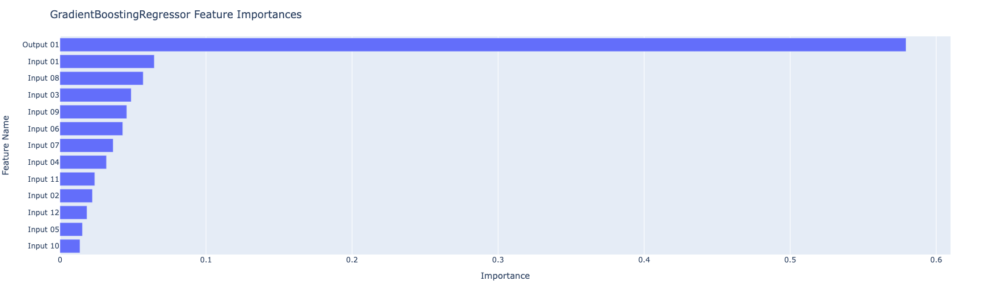

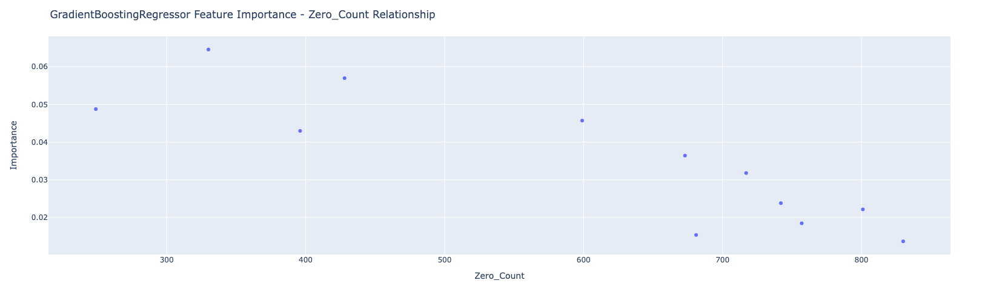

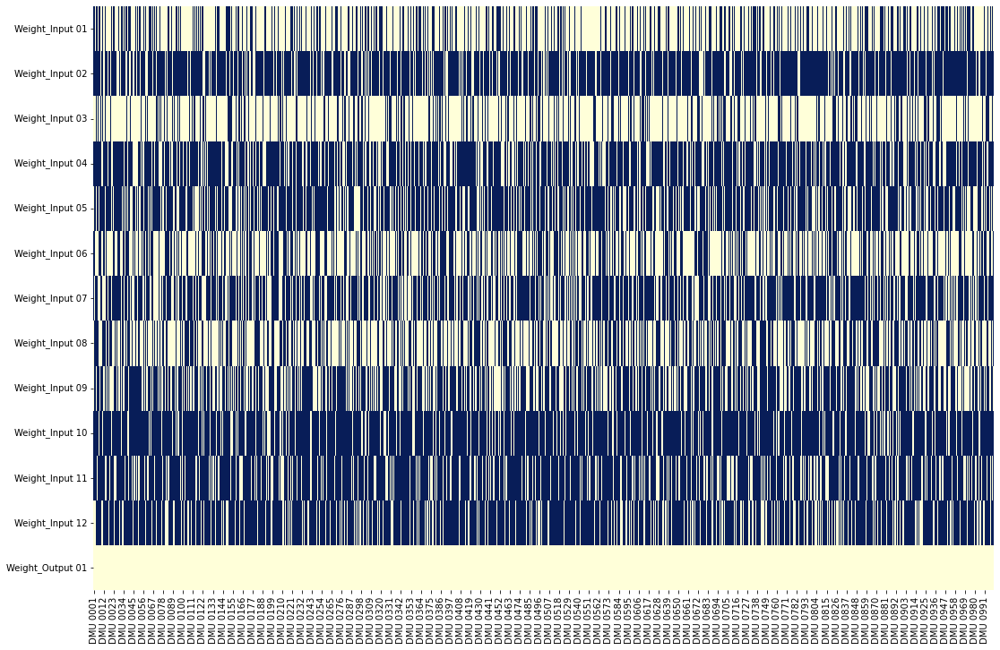

In [14]:
pipe_gb, r, y, df_merged = ml(i=i)
results.append(r)

In [15]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.7027  0.7514 -0.0487     -6.4870           False
1        0.8544  0.8656 -0.0112     -1.2959            True
2        0.9702  1.0000 -0.0298     -2.9845            True
3        0.8979  0.8711  0.0269      3.0828           False
4        0.7586  0.7903 -0.0317     -4.0146           False
..          ...     ...     ...         ...             ...
195      0.7346  0.7837 -0.0491     -6.2604           False
196      0.8815  0.8507  0.0308      3.6215           False
197      0.8627  0.8364  0.0263      3.1416           False
198      0.9530  1.0000 -0.0470     -4.7046           False
199      0.8172  0.8264 -0.0092     -1.1118            True

[200 rows x 5 columns]
blue:  96
red:  104
rho: 0.9434
p-Value 0.0


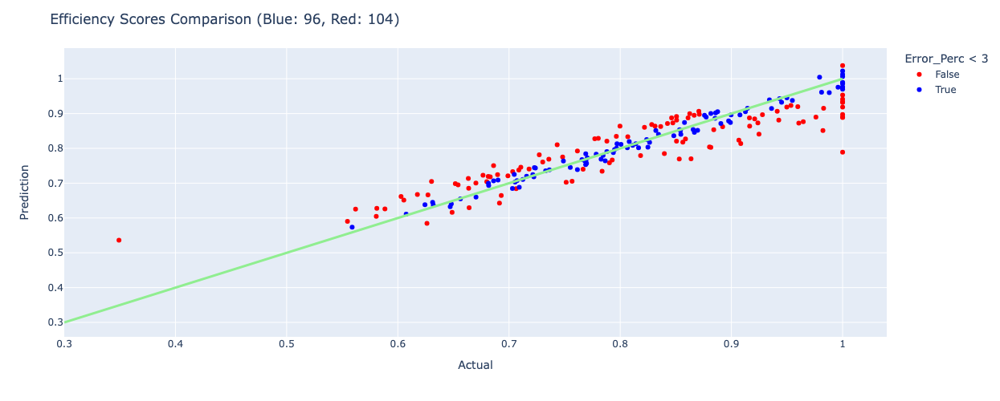

In [16]:
compareML(pipe_gb, y)

### i = 1

In [17]:
i +=1

In [18]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     532
Weight_Input 03       1
Weight_Input 04     319
Weight_Input 05     757
Weight_Input 06      42
Weight_Input 07     200
Weight_Input 08       1
Weight_Input 09      12
Weight_Input 10     865
Weight_Input 11     401
Weight_Input 12     635
Weight_Output 01      0
dtype: int64
Total Zeros:  3765
neg_mean_squared_error: -0.0007980124412774086
neg_root_mean_squared_error: -0.028152375480346055
r2: 0.9330223564749056
grid.best_score:  -0.01896877051970531
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

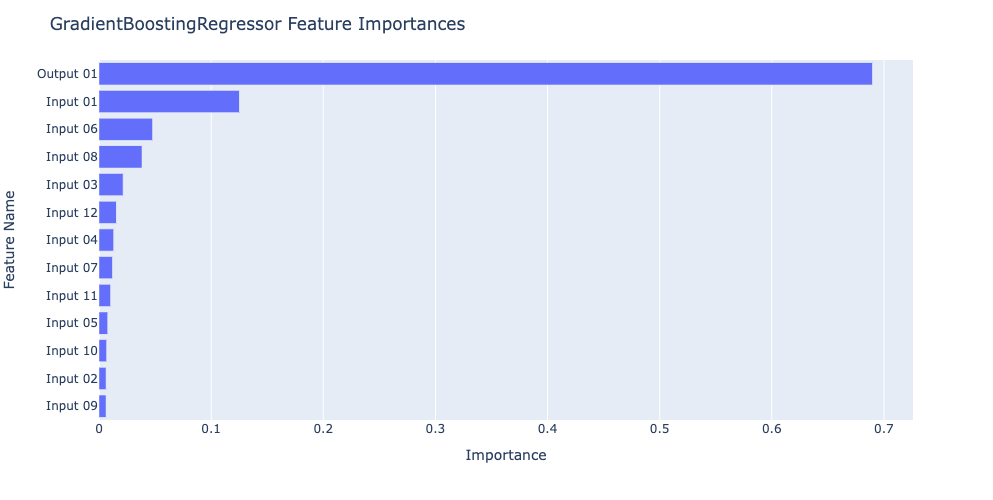

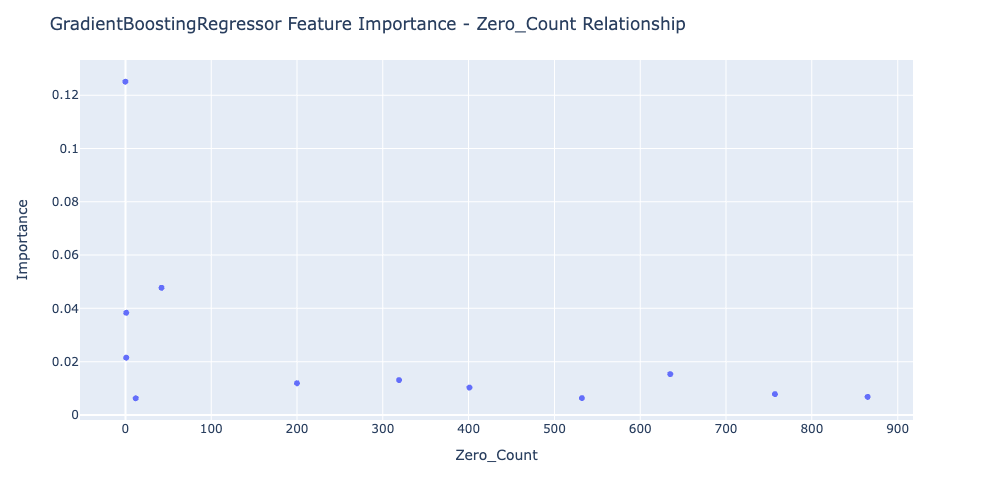

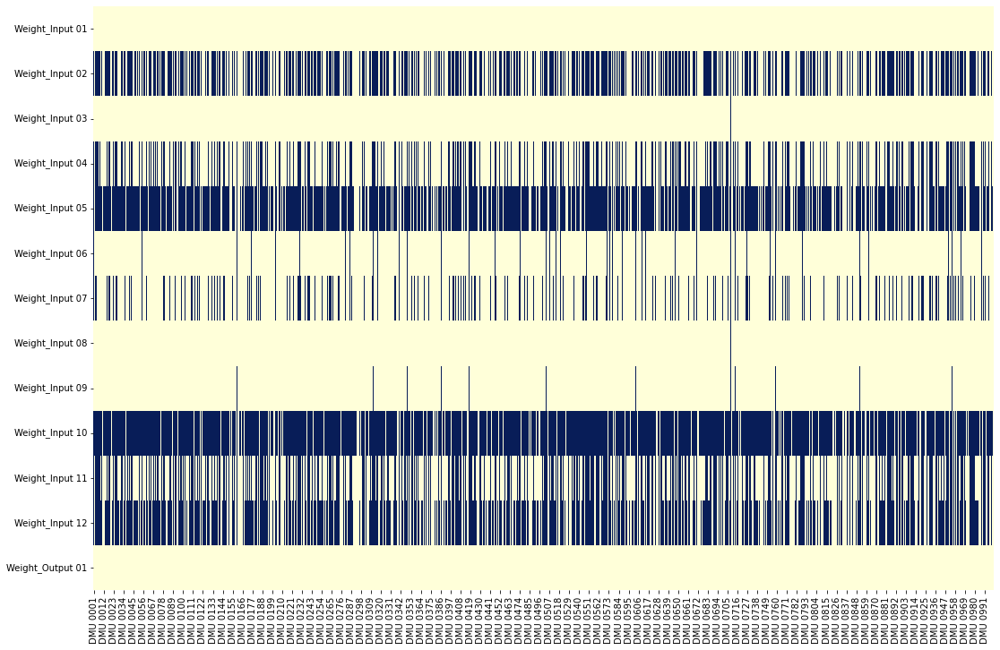

In [19]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_1.xlsx", i=i)
results.append(r)

In [20]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6276  0.6362 -0.0086     -1.3520            True
1        0.6625  0.6370  0.0255      4.0027           False
2        0.8145  0.8033  0.0112      1.3969            True
3        0.8430  0.8267  0.0164      1.9795            True
4        0.7291  0.7673 -0.0382     -4.9751           False
..          ...     ...     ...         ...             ...
195      0.7304  0.7345 -0.0041     -0.5517            True
196      0.8286  0.8089  0.0197      2.4396            True
197      0.7740  0.7929 -0.0189     -2.3894            True
198      0.8264  0.8652 -0.0388     -4.4807           False
199      0.7901  0.8113 -0.0212     -2.6157            True

[200 rows x 5 columns]
blue:  120
red:  80
rho: 0.968
p-Value 0.0


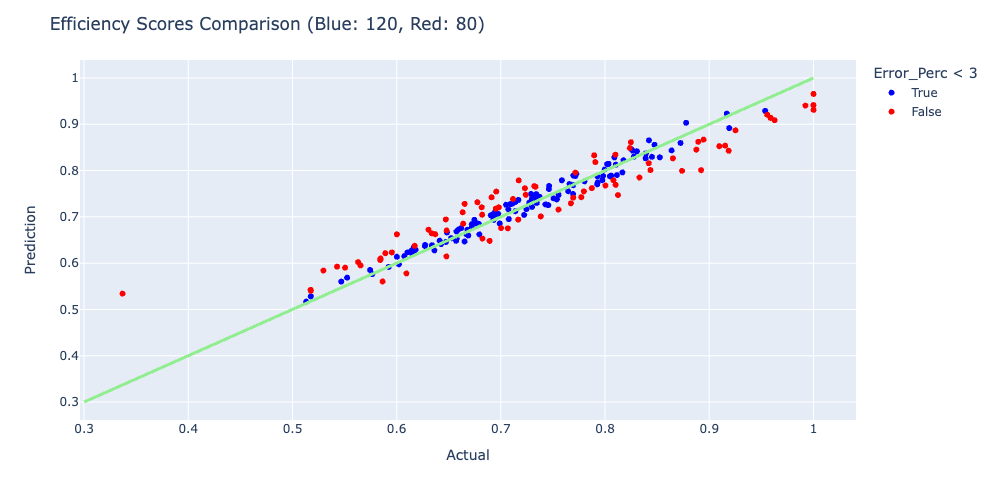

In [21]:
compareML(pipe_gb, y)

blue :  630
red :  370


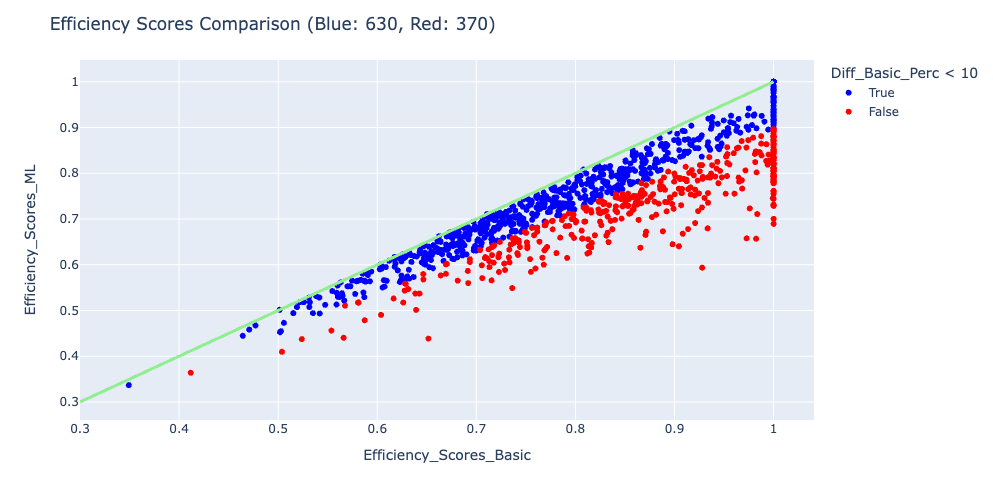

In [22]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_1.xlsx")

### i = 2

In [23]:
i +=1

In [24]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     879
Weight_Input 03      57
Weight_Input 04     286
Weight_Input 05     455
Weight_Input 06       1
Weight_Input 07     343
Weight_Input 08      18
Weight_Input 09     909
Weight_Input 10     620
Weight_Input 11     357
Weight_Input 12     229
Weight_Output 01      0
dtype: int64
Total Zeros:  4154
neg_mean_squared_error: -0.0006839952729703412
neg_root_mean_squared_error: -0.02605521250963626
r2: 0.9459078761153844
grid.best_score:  -0.019407200891519295
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

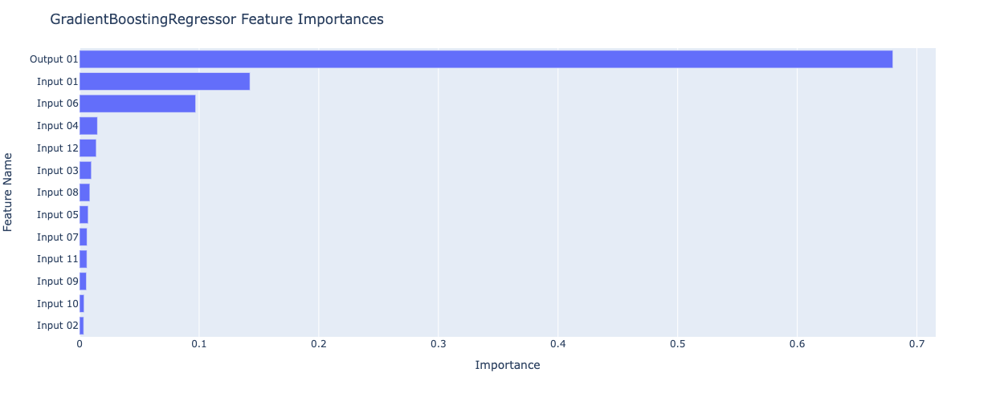

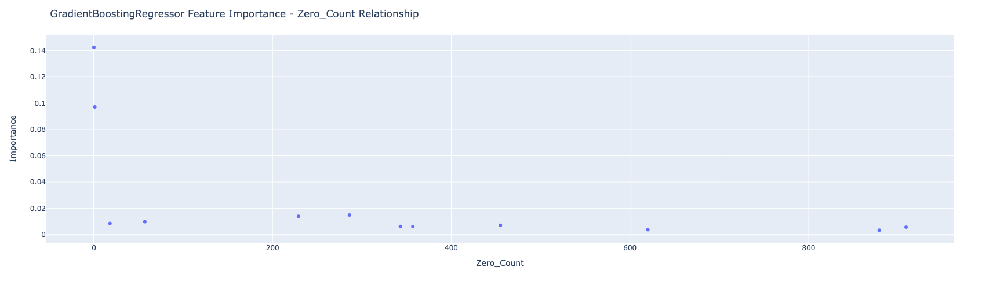

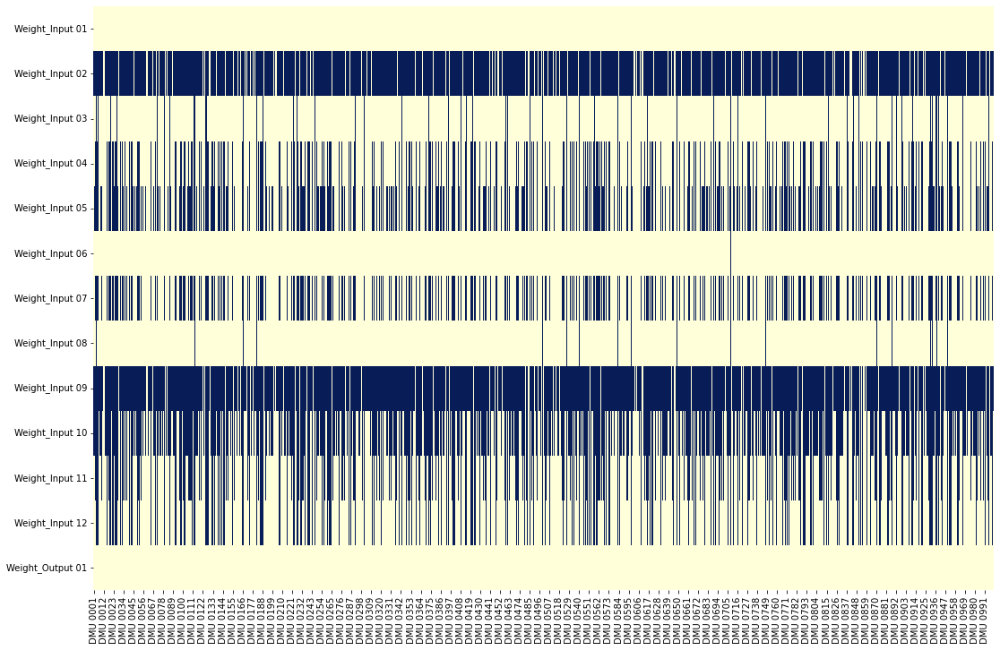

In [25]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_2.xlsx", i=i)
results.append(r)

In [26]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6284  0.6226  0.0058      0.9360            True
1        0.6168  0.5860  0.0308      5.2486           False
2        0.8210  0.8293 -0.0082     -0.9914            True
3        0.8352  0.8323  0.0028      0.3415            True
4        0.7031  0.7260 -0.0229     -3.1569           False
..          ...     ...     ...         ...             ...
195      0.7437  0.7625 -0.0188     -2.4650            True
196      0.8202  0.8005  0.0197      2.4650            True
197      0.7675  0.7902 -0.0227     -2.8707            True
198      0.8031  0.8025  0.0005      0.0663            True
199      0.7703  0.8160 -0.0457     -5.5997           False

[200 rows x 5 columns]
blue:  130
red:  70
rho: 0.9767
p-Value 0.0


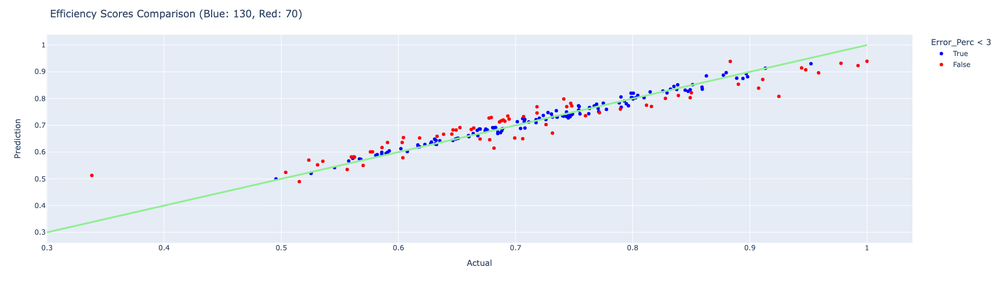

In [27]:
compareML(pipe_gb, y)

blue :  526
red :  474


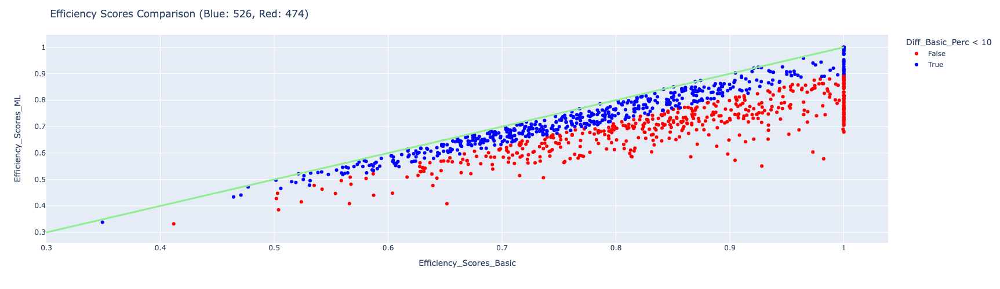

blue :  983
red :  17


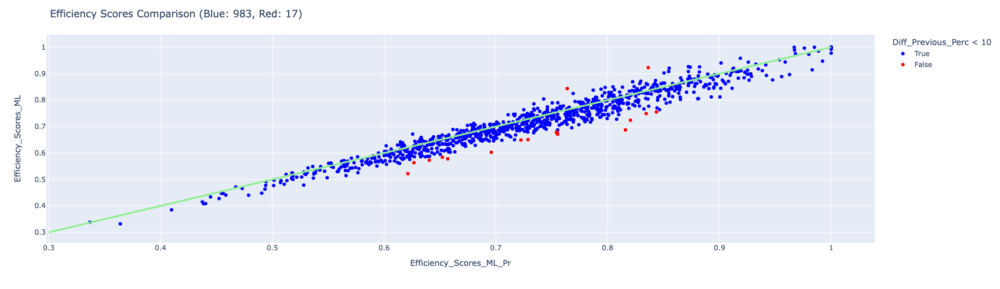

In [28]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_2.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_1.xlsx")

### i = 3

In [29]:
i +=1

In [30]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     861
Weight_Input 03     126
Weight_Input 04      86
Weight_Input 05     239
Weight_Input 06       1
Weight_Input 07     278
Weight_Input 08     137
Weight_Input 09     425
Weight_Input 10     554
Weight_Input 11     307
Weight_Input 12     124
Weight_Output 01      0
dtype: int64
Total Zeros:  3138
neg_mean_squared_error: -0.000594050770191858
neg_root_mean_squared_error: -0.024227527087503607
r2: 0.95506768492702
grid.best_score:  -0.019407069607957135
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, mi

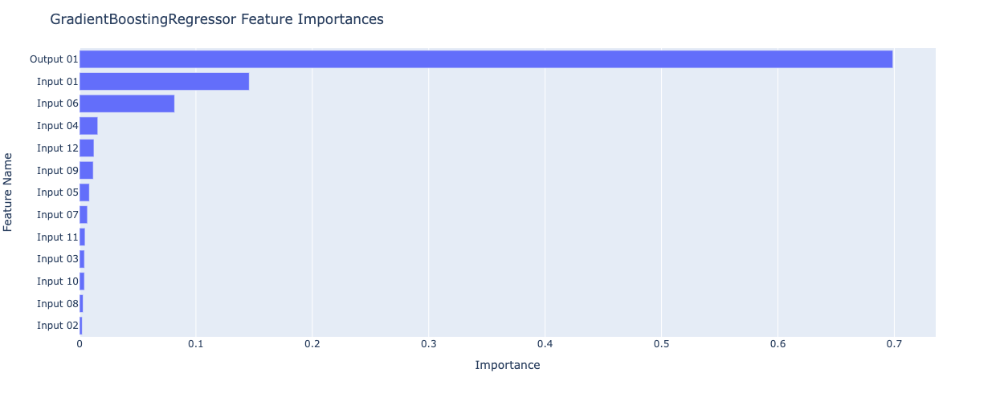

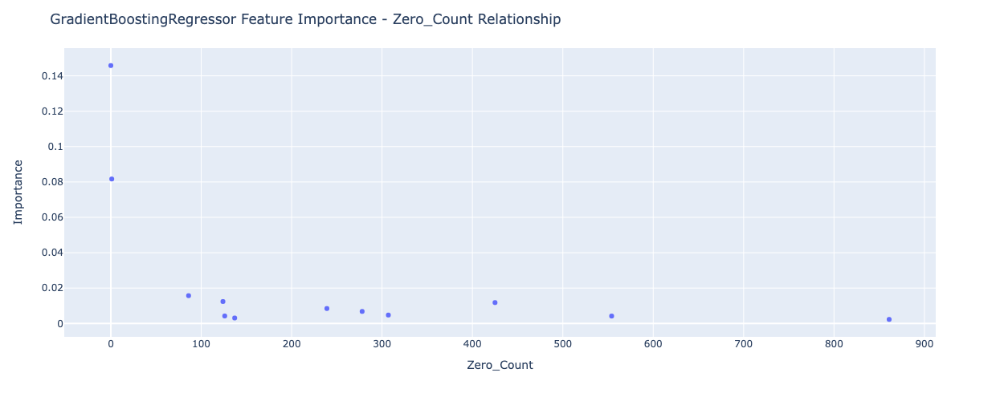

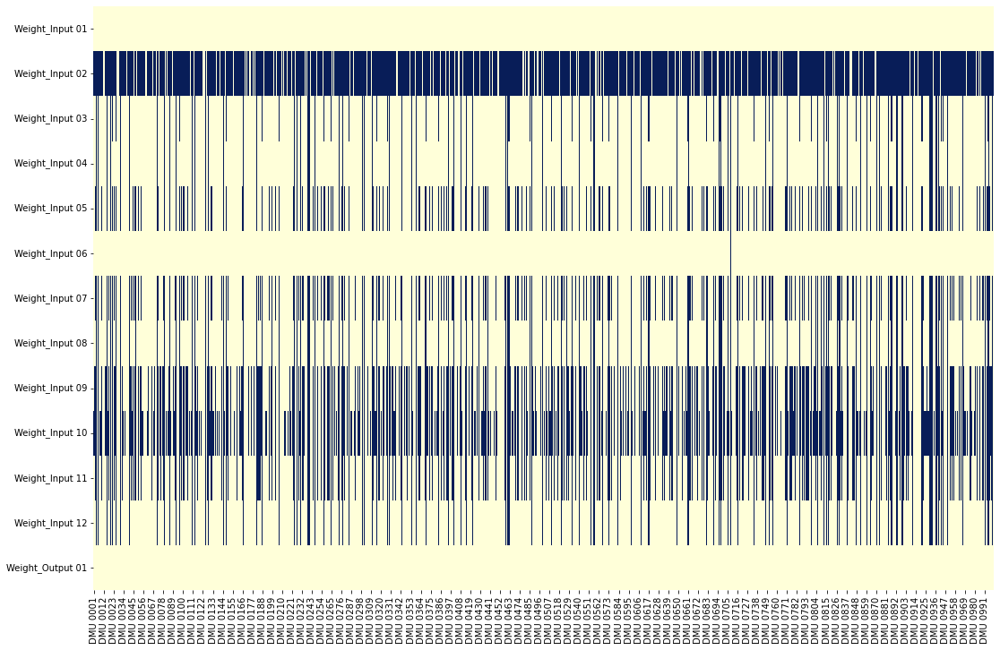

In [31]:
pipe_gb, r, y,df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_3.xlsx", i=i)
results.append(r)

In [32]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6172  0.6113  0.0059      0.9693            True
1        0.5843  0.5852 -0.0009     -0.1540            True
2        0.8315  0.8293  0.0022      0.2696            True
3        0.8075  0.7888  0.0187      2.3701            True
4        0.6940  0.7092 -0.0152     -2.1390            True
..          ...     ...     ...         ...             ...
195      0.7151  0.7613 -0.0463     -6.0786           False
196      0.7960  0.7941  0.0019      0.2391            True
197      0.7590  0.7877 -0.0286     -3.6373           False
198      0.7675  0.7971 -0.0296     -3.7090           False
199      0.7299  0.7725 -0.0426     -5.5132           False

[200 rows x 5 columns]
blue:  137
red:  63
rho: 0.9822
p-Value 0.0


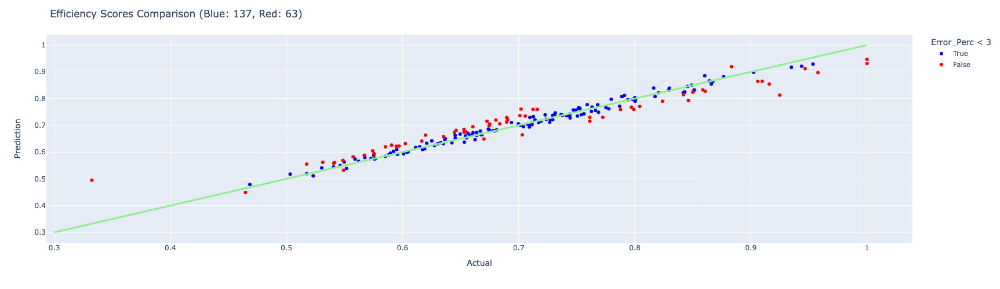

In [33]:
compareML(pipe_gb, y)

blue :  454
red :  546


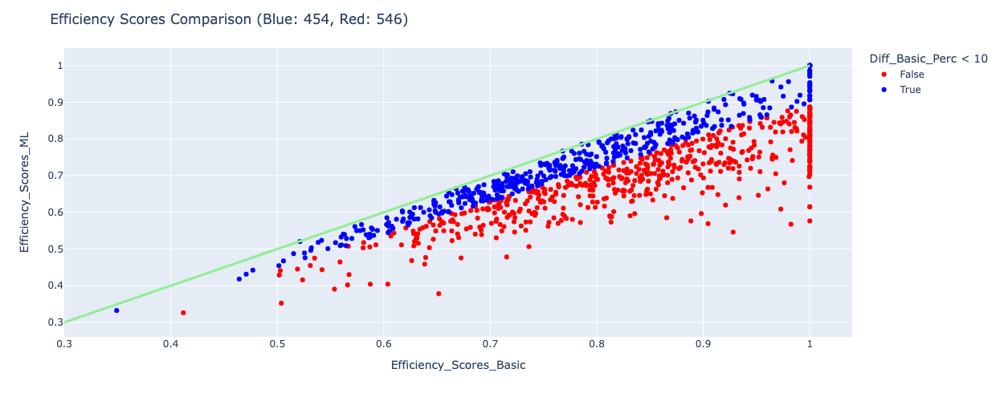

blue :  991
red :  9


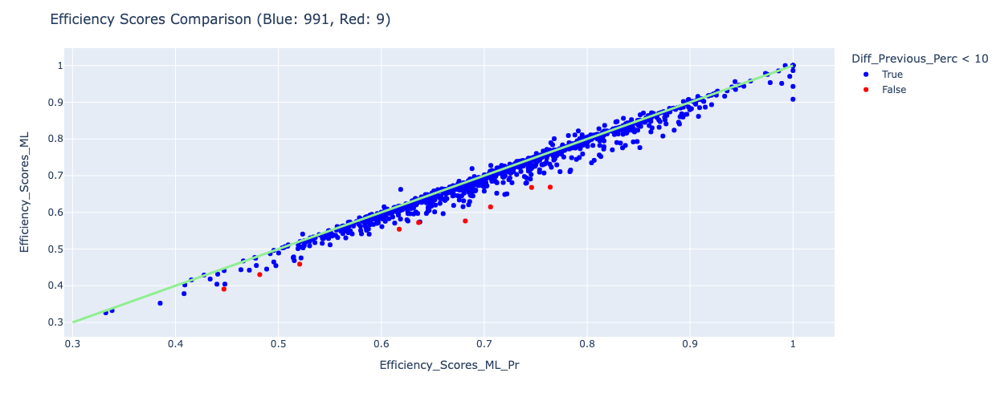

In [34]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_3.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_2.xlsx")

### i = 4

In [35]:
i +=1

In [37]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     819
Weight_Input 03     187
Weight_Input 04      90
Weight_Input 05     157
Weight_Input 06       1
Weight_Input 07     162
Weight_Input 08     439
Weight_Input 09     148
Weight_Input 10     347
Weight_Input 11     169
Weight_Input 12     142
Weight_Output 01      0
dtype: int64
Total Zeros:  2661
neg_mean_squared_error: -0.0006086572853053436
neg_root_mean_squared_error: -0.02452244916934519
r2: 0.9549768070353654
grid.best_score:  -0.01933521378585893
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, m

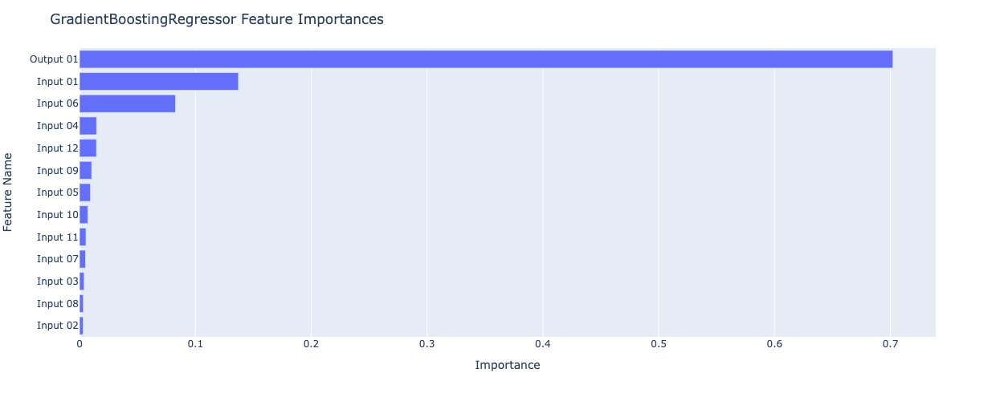

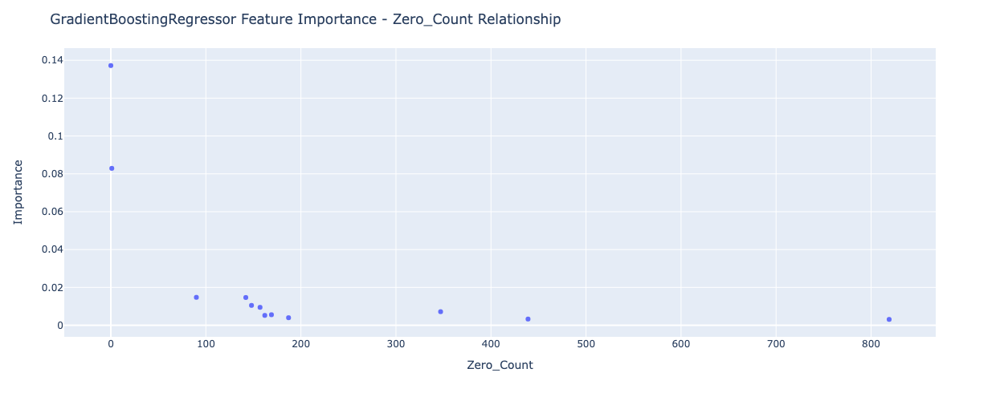

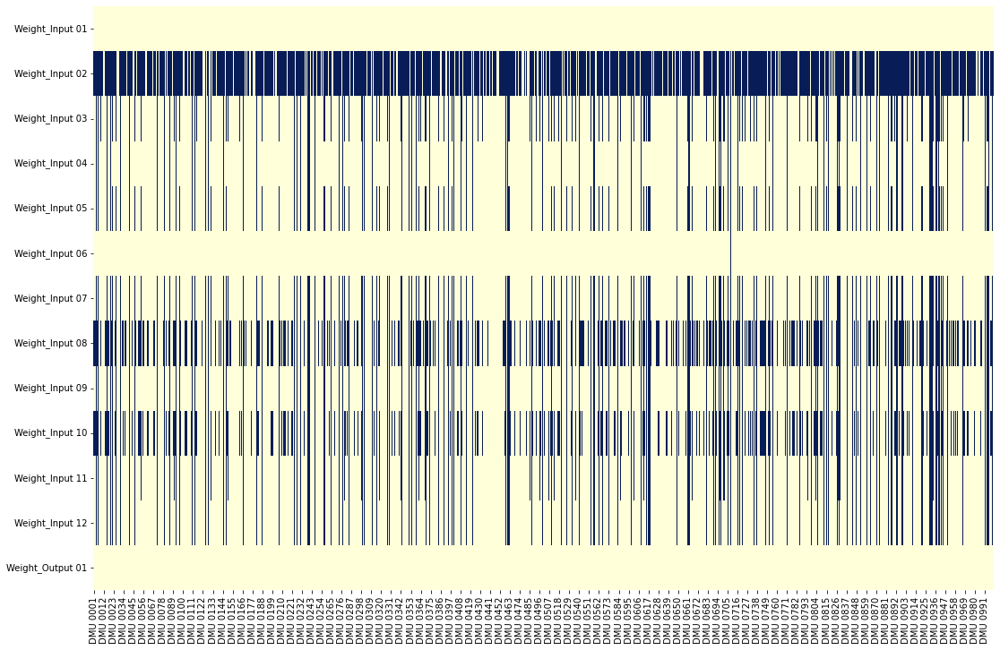

In [38]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_4.xlsx", i=i)
results.append(r)

In [39]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6104  0.6113 -0.0009     -0.1472            True
1        0.5955  0.5852  0.0103      1.7655            True
2        0.8306  0.8329 -0.0023     -0.2805            True
3        0.8015  0.7888  0.0127      1.6121            True
4        0.6874  0.7092 -0.0218     -3.0709           False
..          ...     ...     ...         ...             ...
195      0.7127  0.7613 -0.0486     -6.3884           False
196      0.8014  0.7900  0.0114      1.4421            True
197      0.7576  0.7877 -0.0301     -3.8165           False
198      0.7684  0.7908 -0.0223     -2.8256            True
199      0.7365  0.7725 -0.0360     -4.6589           False

[200 rows x 5 columns]
blue:  136
red:  64
rho: 0.9811
p-Value 0.0


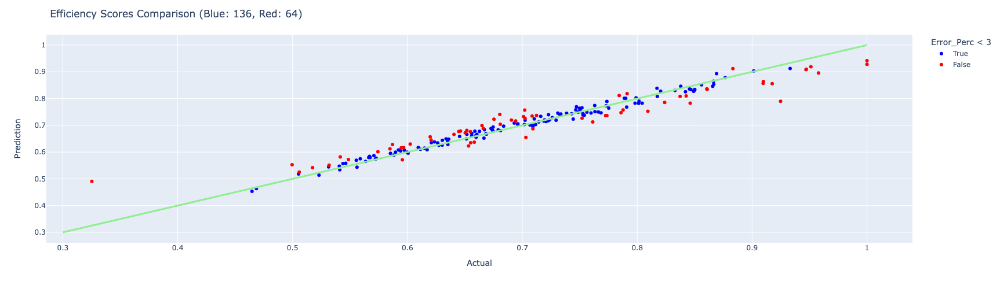

In [40]:
compareML(pipe_gb, y)

blue :  437
red :  563


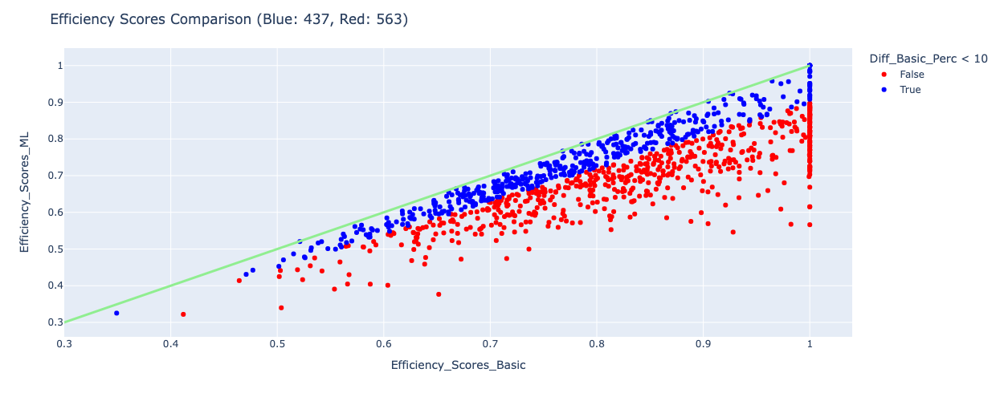

blue :  1000
red :  0


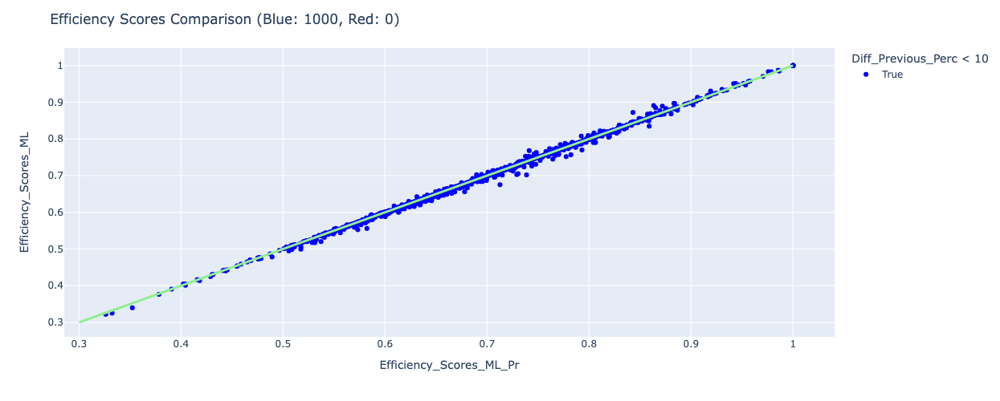

In [41]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_4.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_3.xlsx")

### i = 5

In [42]:
i +=1

In [43]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     799
Weight_Input 03     201
Weight_Input 04      91
Weight_Input 05     161
Weight_Input 06       1
Weight_Input 07     182
Weight_Input 08     334
Weight_Input 09     151
Weight_Input 10     172
Weight_Input 11     182
Weight_Input 12     143
Weight_Output 01      0
dtype: int64
Total Zeros:  2417
neg_mean_squared_error: -0.0006064343229109263
neg_root_mean_squared_error: -0.02445937772245598
r2: 0.9550558205819689
grid.best_score:  -0.019802983535445767
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

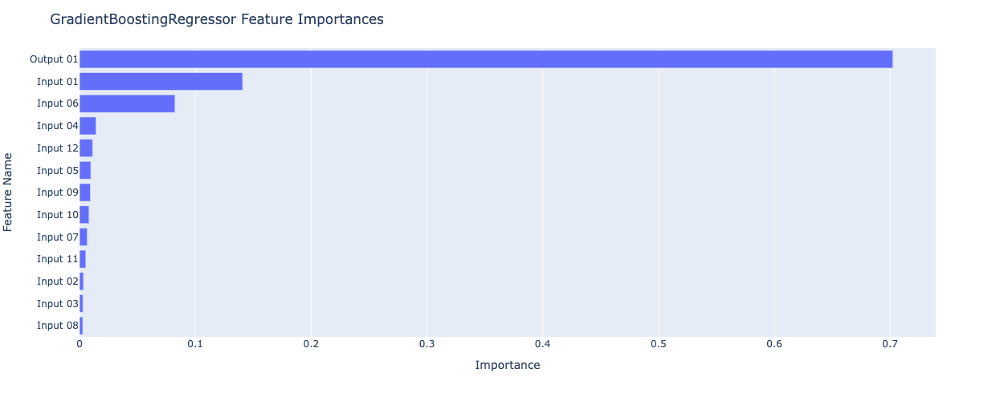

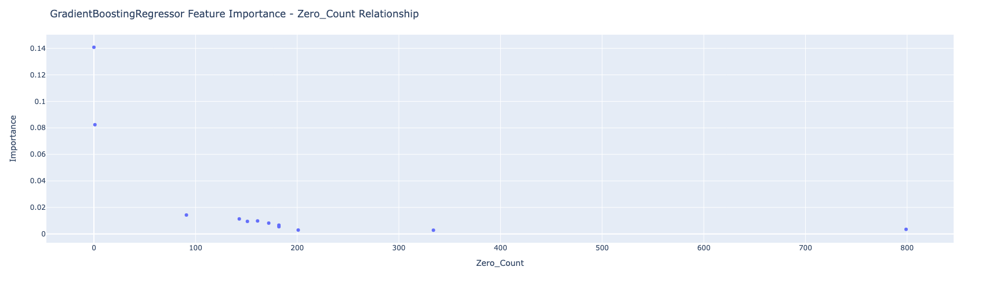

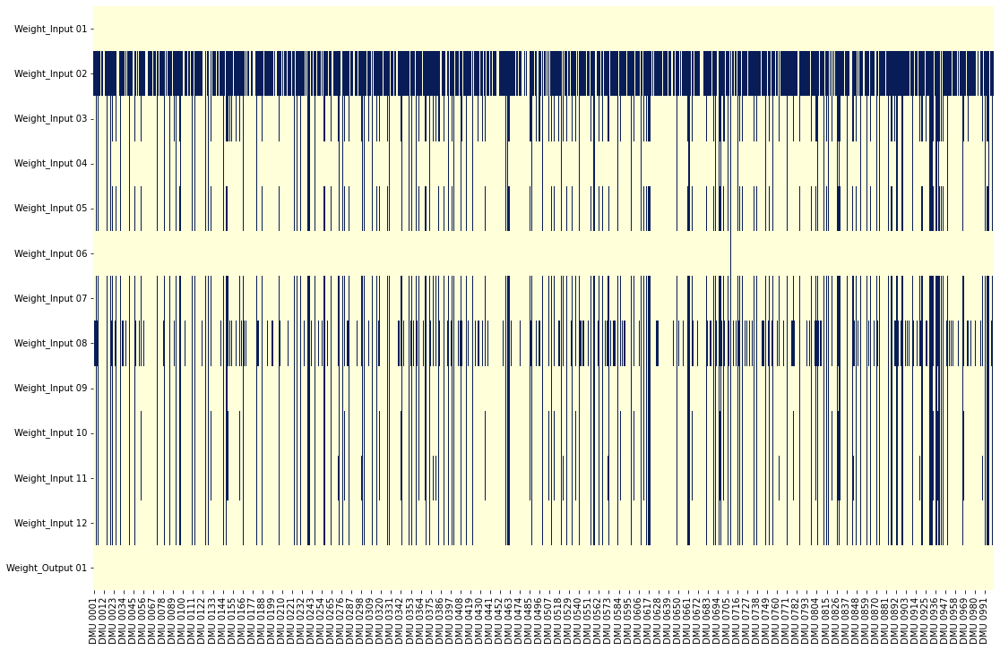

In [44]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_5.xlsx", i=i)
results.append(r)

In [45]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6124  0.6128 -0.0004     -0.0726            True
1        0.5896  0.5852  0.0045      0.7643            True
2        0.8275  0.8257  0.0019      0.2254            True
3        0.8166  0.7888  0.0278      3.5273           False
4        0.6886  0.7092 -0.0205     -2.8926            True
..          ...     ...     ...         ...             ...
195      0.7084  0.7613 -0.0530     -6.9568           False
196      0.8024  0.7900  0.0124      1.5655            True
197      0.7574  0.7877 -0.0303     -3.8444           False
198      0.7603  0.7908 -0.0305     -3.8551           False
199      0.7340  0.7725 -0.0385     -4.9881           False

[200 rows x 5 columns]
blue:  136
red:  64
rho: 0.9819
p-Value 0.0


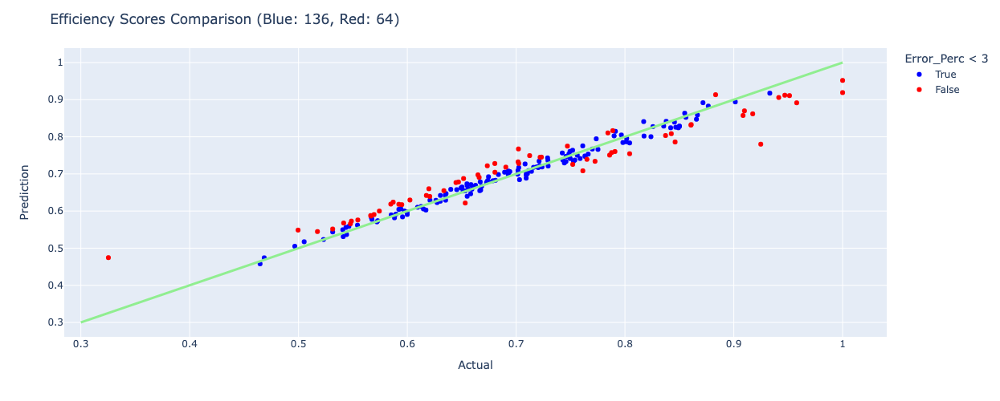

In [46]:
compareML(pipe_gb, y)

blue :  430
red :  570


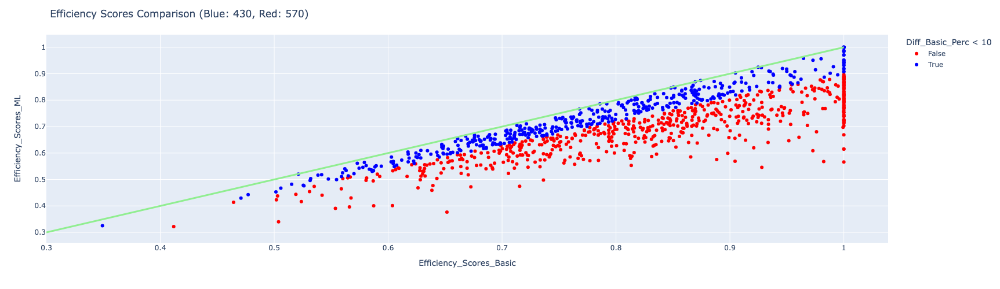

blue :  1000
red :  0


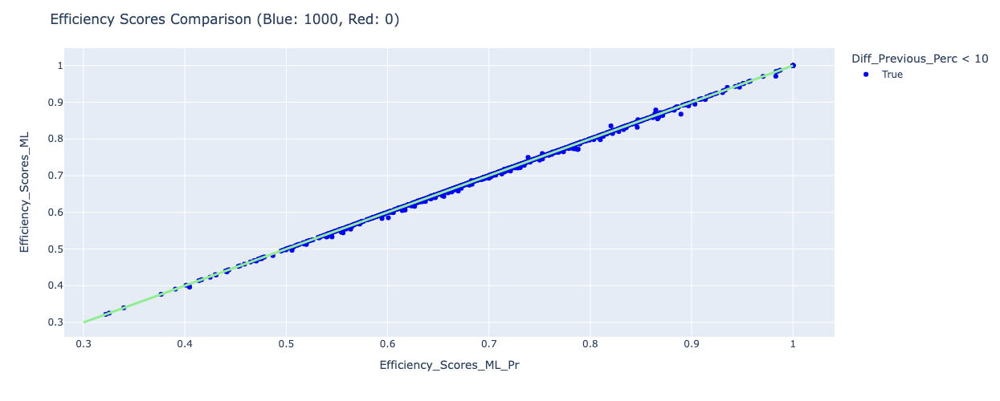

In [47]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_5.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_4.xlsx")

### i = 6

In [48]:
i +=1

In [49]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     478
Weight_Input 03     496
Weight_Input 04     100
Weight_Input 05     176
Weight_Input 06       1
Weight_Input 07     239
Weight_Input 08     589
Weight_Input 09     199
Weight_Input 10     207
Weight_Input 11     313
Weight_Input 12     167
Weight_Output 01      0
dtype: int64
Total Zeros:  2965
neg_mean_squared_error: -0.0006113619798297287
neg_root_mean_squared_error: -0.02458051975264398
r2: 0.9552732008472649
grid.best_score:  -0.019488438980616207
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

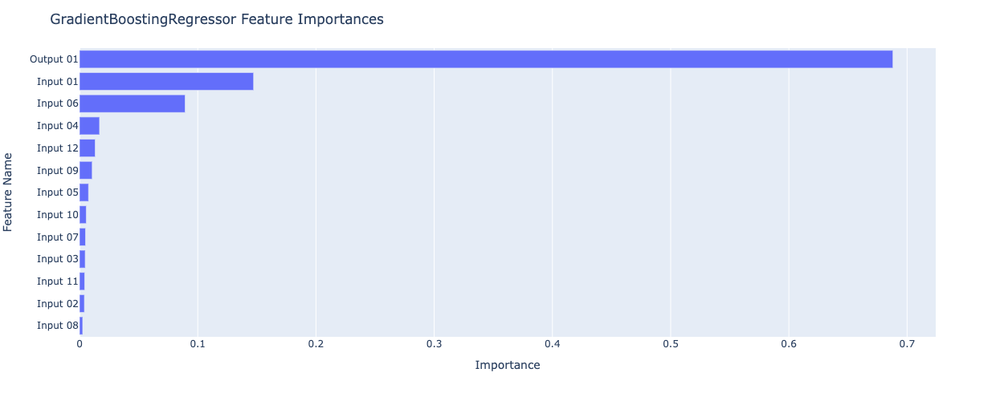

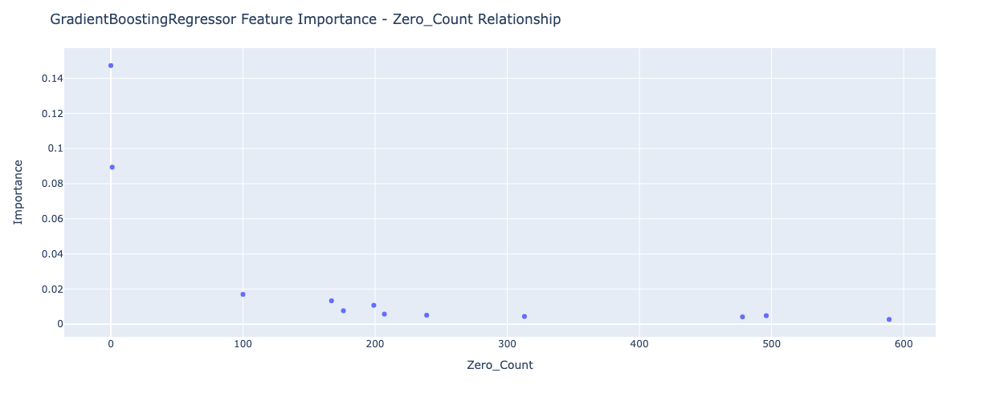

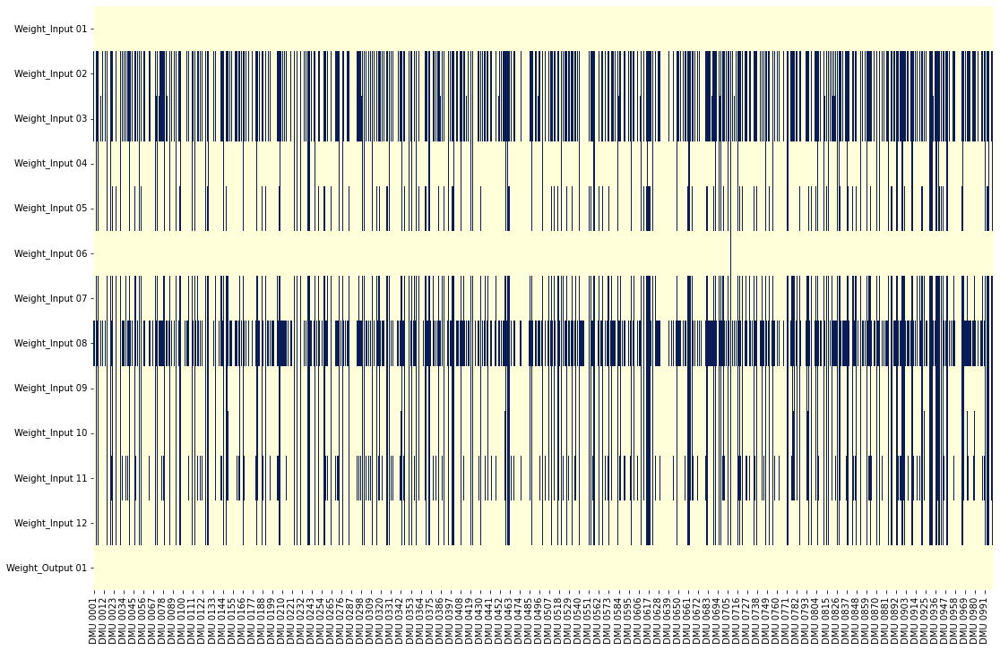

In [50]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_6.xlsx", i=i)
results.append(r)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6118  0.6128 -0.0011     -0.1751            True
1        0.5812  0.5611  0.0201      3.5807           False
2        0.8106  0.8159 -0.0053     -0.6456            True
3        0.8125  0.7888  0.0237      3.0060           False
4        0.6888  0.6969 -0.0082     -1.1725            True
..          ...     ...     ...         ...             ...
195      0.7166  0.7613 -0.0447     -5.8718           False
196      0.8013  0.7853  0.0160      2.0350            True
197      0.7615  0.7841 -0.0226     -2.8808            True
198      0.7520  0.7829 -0.0309     -3.9409           False
199      0.7345  0.7725 -0.0380     -4.9166           False

[200 rows x 5 columns]
blue:  125
red:  75
rho: 0.9838
p-Value 0.0


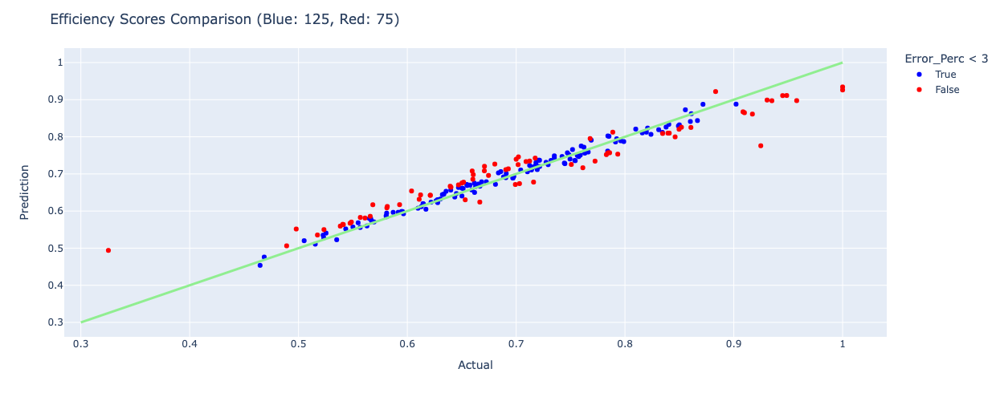

In [51]:
compareML(pipe_gb, y)

In [52]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

blue :  405
red :  595


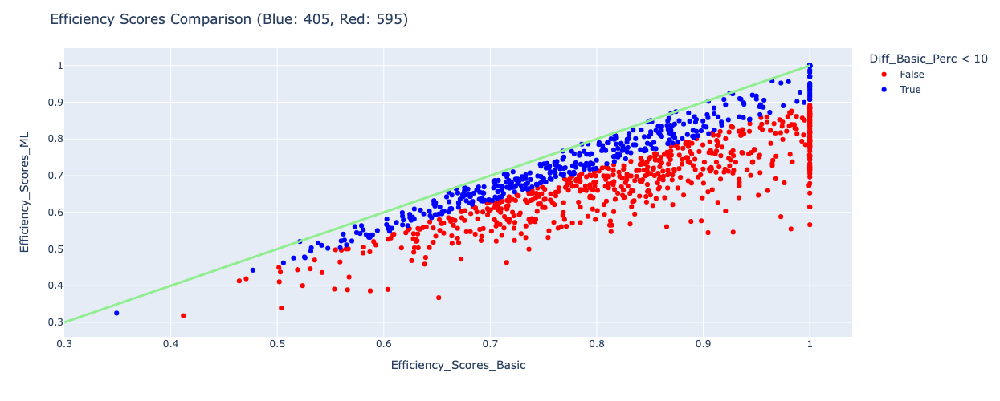

blue :  1000
red :  0


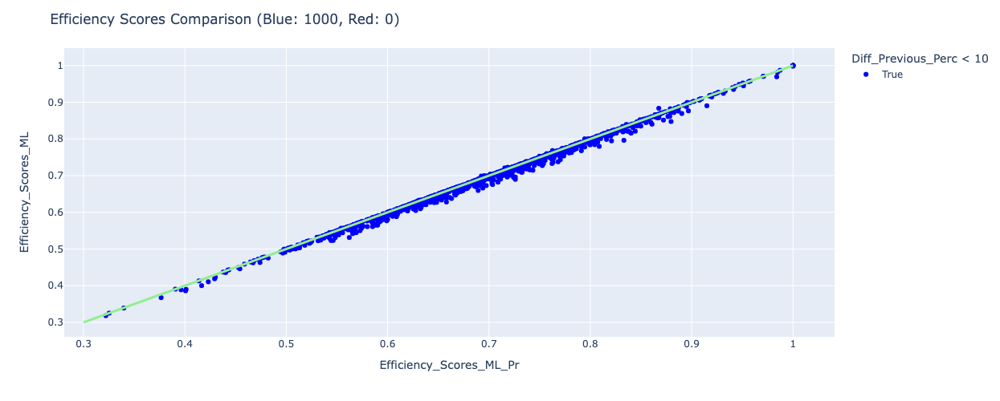

In [53]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_6.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_5.xlsx")

### i = 7

In [54]:
i +=1

In [55]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     643
Weight_Input 03     231
Weight_Input 04      96
Weight_Input 05     172
Weight_Input 06       1
Weight_Input 07     194
Weight_Input 08     680
Weight_Input 09     162
Weight_Input 10     185
Weight_Input 11     350
Weight_Input 12     154
Weight_Output 01      0
dtype: int64
Total Zeros:  2868
neg_mean_squared_error: -0.0006169063083842984
neg_root_mean_squared_error: -0.02467811096977899
r2: 0.9546657883299883
grid.best_score:  -0.019958744620245127
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

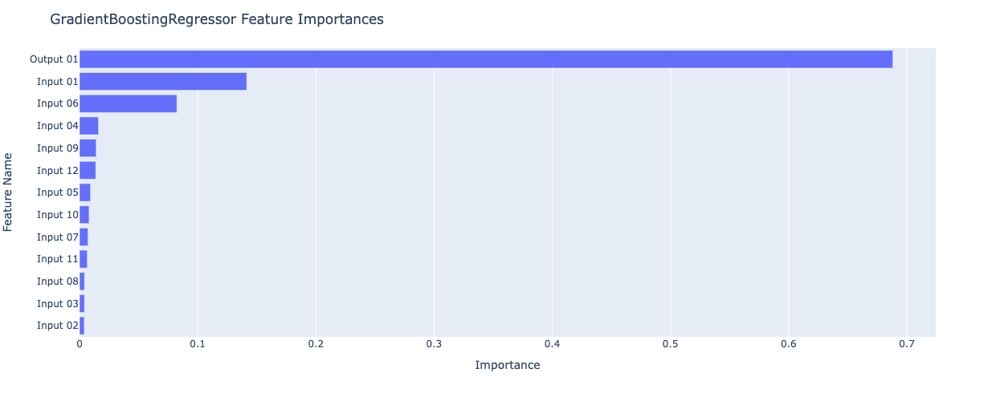

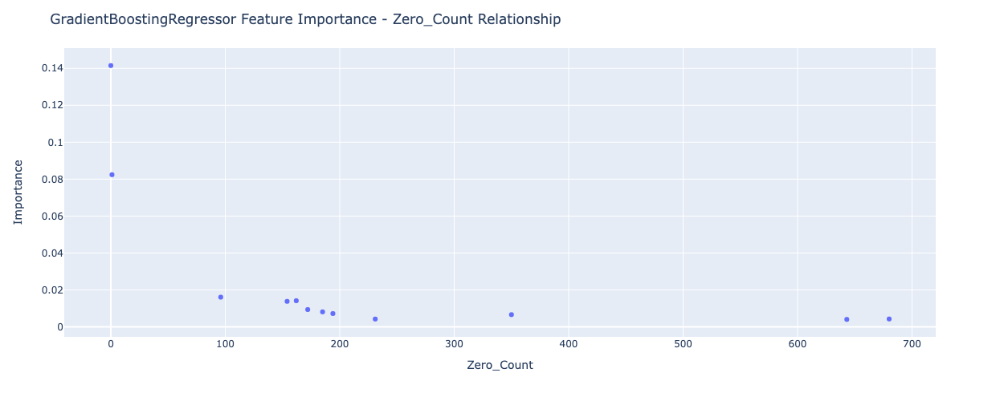

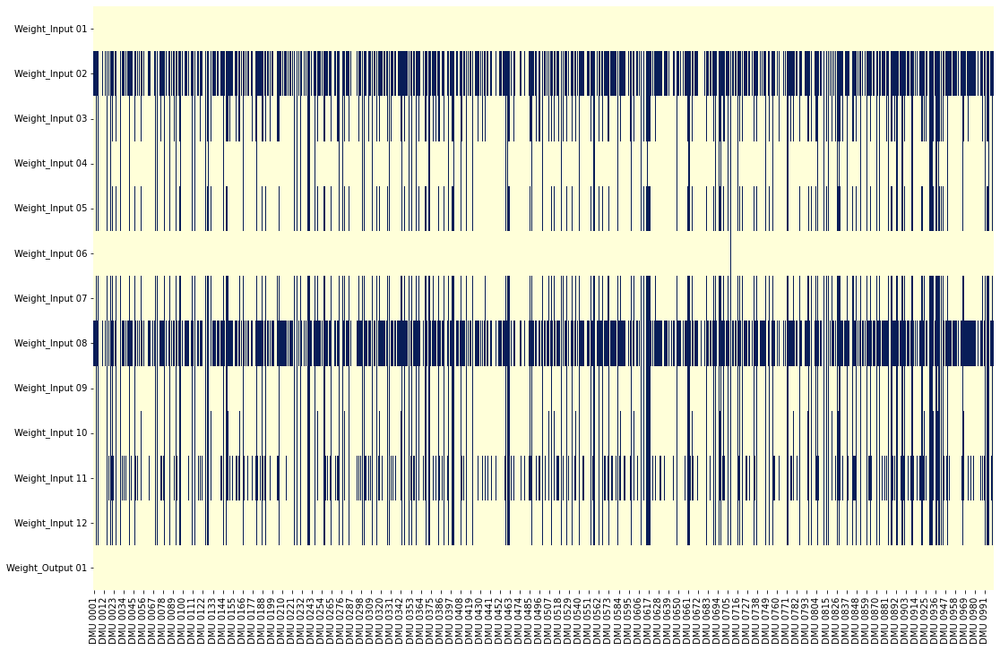

In [56]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_7.xlsx", i=i)
results.append(r)

In [57]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6168  0.6128  0.0039      0.6392            True
1        0.5769  0.5725  0.0044      0.7701            True
2        0.8186  0.8205 -0.0019     -0.2341            True
3        0.8103  0.7888  0.0215      2.7234            True
4        0.6923  0.7049 -0.0126     -1.7943            True
..          ...     ...     ...         ...             ...
195      0.7096  0.7613 -0.0517     -6.7903           False
196      0.8009  0.7861  0.0147      1.8725            True
197      0.7629  0.7861 -0.0232     -2.9461            True
198      0.7543  0.7850 -0.0307     -3.9169           False
199      0.7358  0.7725 -0.0367     -4.7499           False

[200 rows x 5 columns]
blue:  127
red:  73
rho: 0.9816
p-Value 0.0


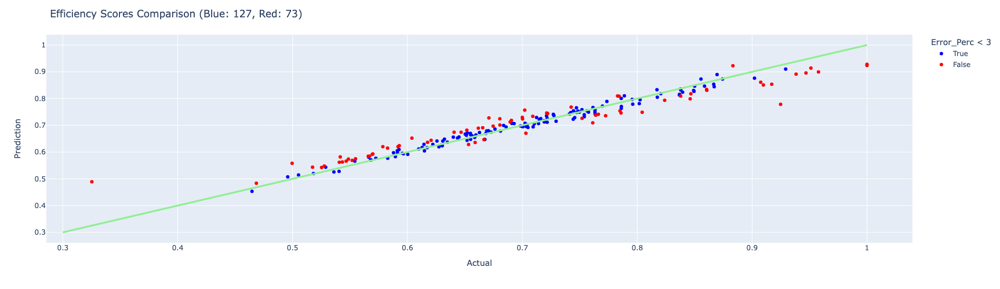

In [58]:
compareML(pipe_gb, y)

blue :  424
red :  576


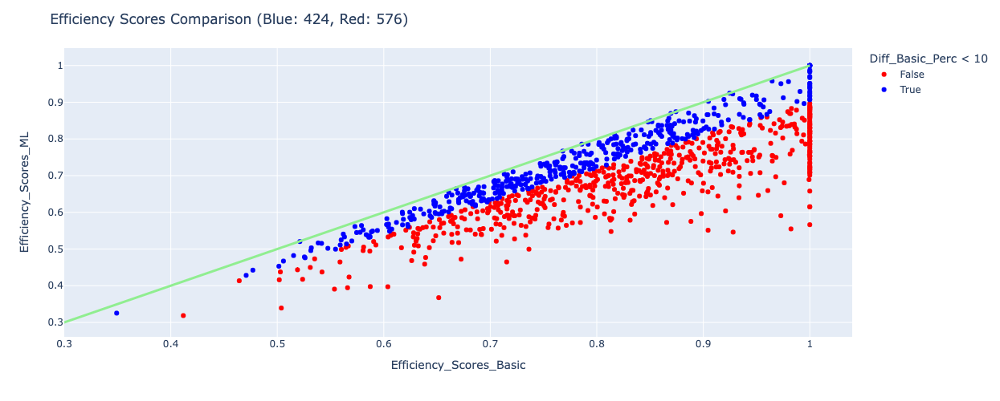

blue :  1000
red :  0


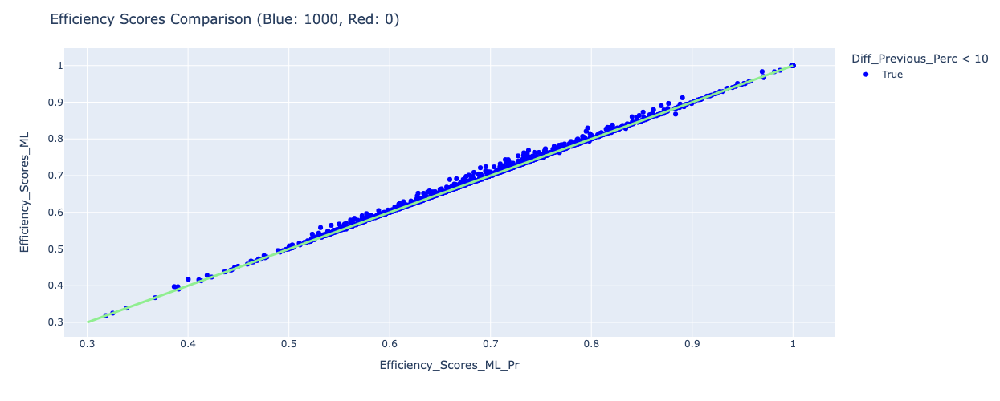

In [59]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_7.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_6.xlsx")

### i = 8

In [60]:
i +=1

In [61]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     831
Weight_Input 03     286
Weight_Input 04      88
Weight_Input 05     168
Weight_Input 06       1
Weight_Input 07     185
Weight_Input 08     210
Weight_Input 09     125
Weight_Input 10     177
Weight_Input 11     199
Weight_Input 12     147
Weight_Output 01      0
dtype: int64
Total Zeros:  2417
neg_mean_squared_error: -0.0006037080587858762
neg_root_mean_squared_error: -0.024424873747227783
r2: 0.9551381330981249
grid.best_score:  -0.01914965871673812
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, 

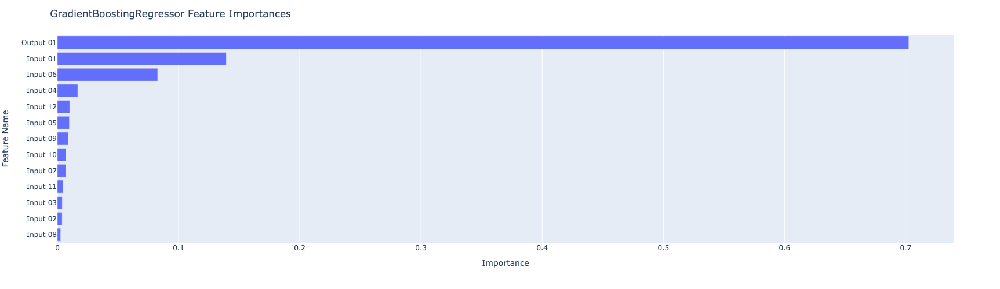

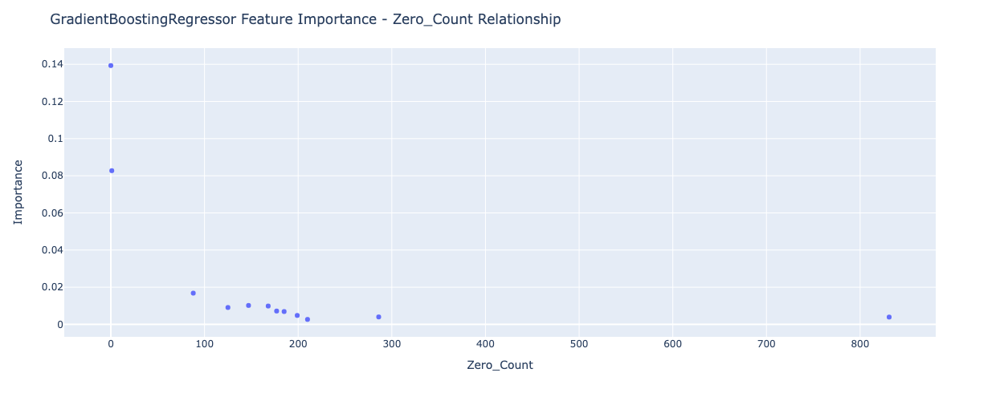

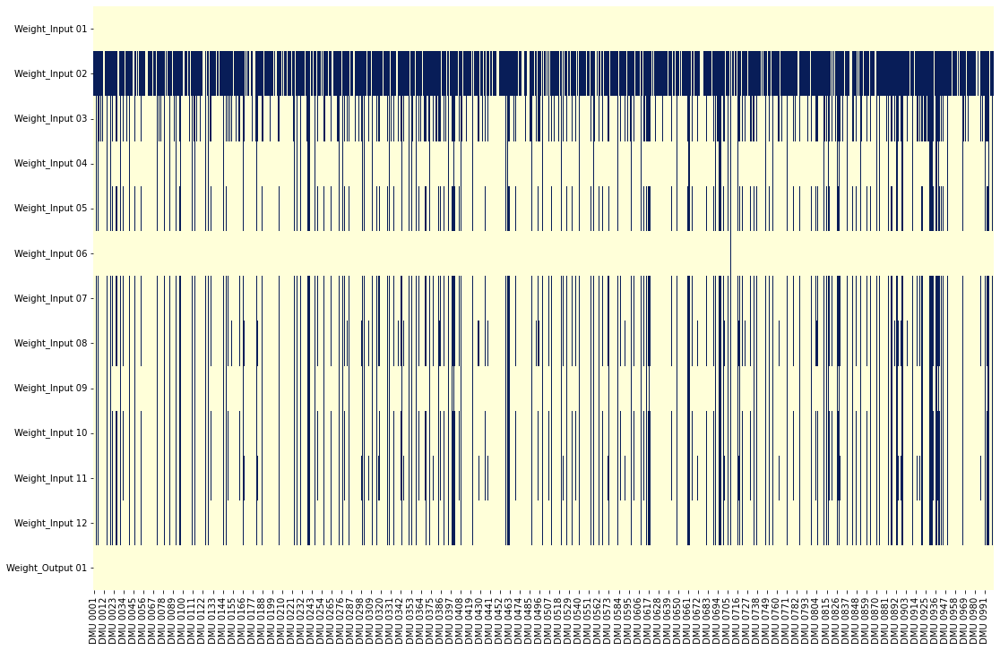

In [62]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_8.xlsx", i=i)
results.append(r)

In [63]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6175  0.6128  0.0047      0.7600            True
1        0.5896  0.5852  0.0045      0.7614            True
2        0.8263  0.8223  0.0040      0.4825            True
3        0.8084  0.7888  0.0196      2.4836            True
4        0.6906  0.7092 -0.0185     -2.6112            True
..          ...     ...     ...         ...             ...
195      0.7041  0.7613 -0.0572     -7.5186           False
196      0.7924  0.7901  0.0023      0.2884            True
197      0.7580  0.7877 -0.0297     -3.7702           False
198      0.7675  0.7919 -0.0244     -3.0760           False
199      0.7355  0.7725 -0.0370     -4.7872           False

[200 rows x 5 columns]
blue:  128
red:  72
rho: 0.9812
p-Value 0.0


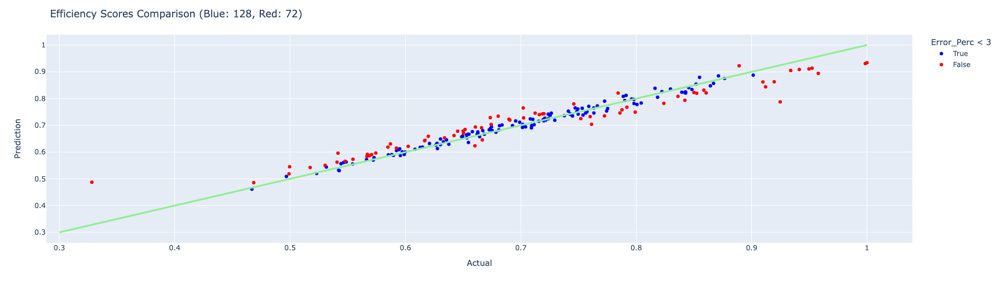

In [64]:
compareML(pipe_gb, y)

blue :  429
red :  571


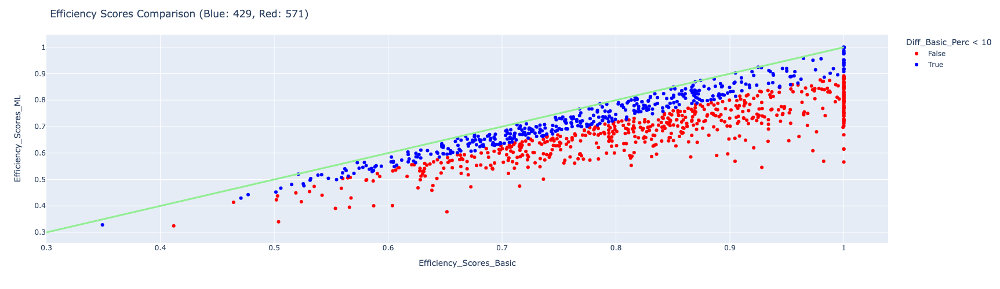

blue :  1000
red :  0


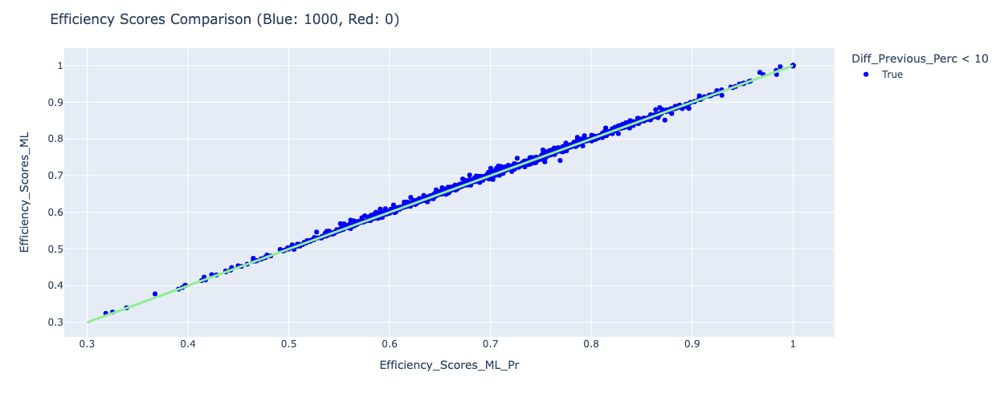

In [65]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_8.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_7.xlsx")

### i = 9

In [66]:
i +=1

In [67]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     634
Weight_Input 03     238
Weight_Input 04      96
Weight_Input 05     164
Weight_Input 06       1
Weight_Input 07     195
Weight_Input 08     671
Weight_Input 09     178
Weight_Input 10     184
Weight_Input 11     215
Weight_Input 12     155
Weight_Output 01      0
dtype: int64
Total Zeros:  2731
neg_mean_squared_error: -0.0006448445738709577
neg_root_mean_squared_error: -0.02521782884800733
r2: 0.9526527381839269
grid.best_score:  -0.01968460300431094
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5, m

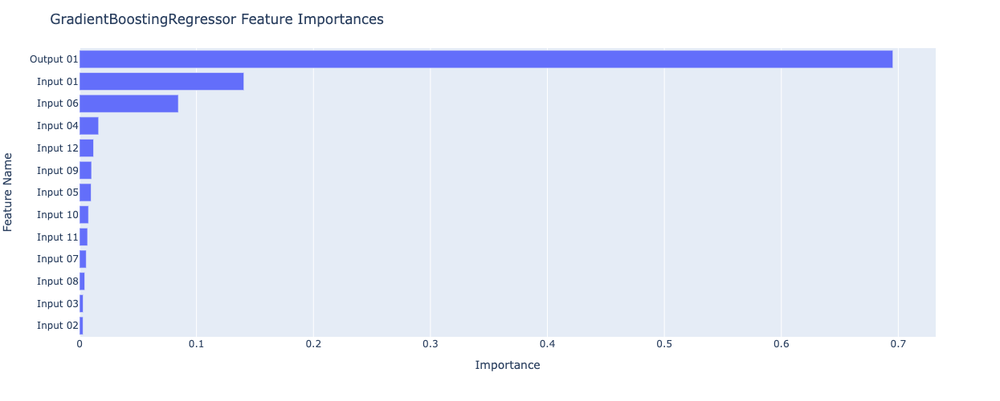

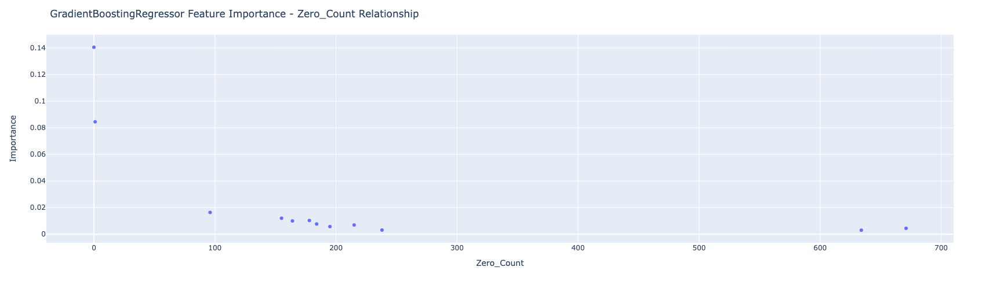

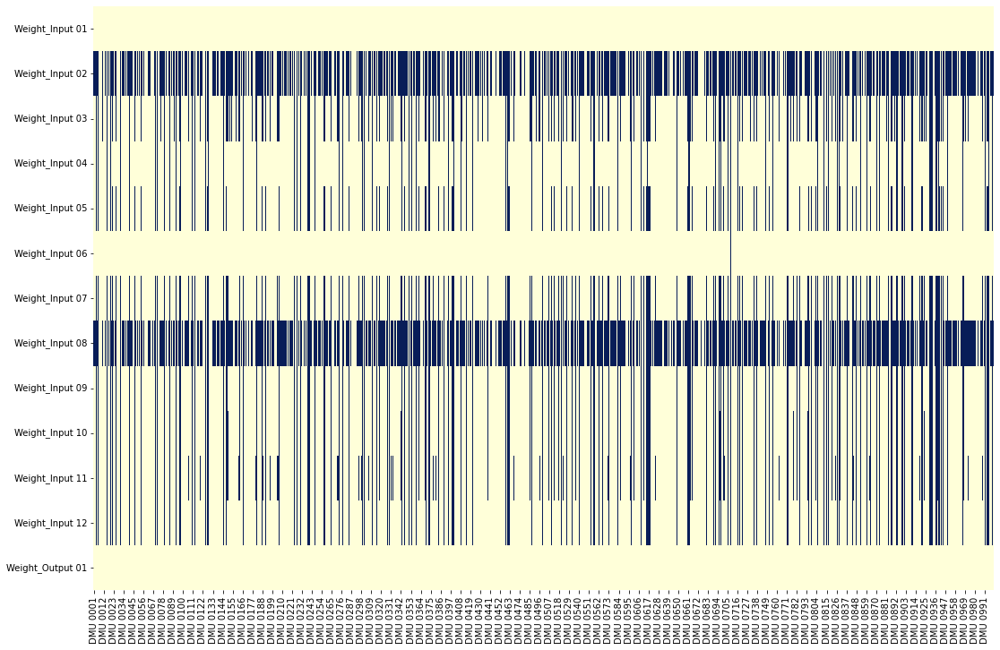

In [68]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_9.xlsx", i=i)
results.append(r)

In [69]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6161  0.6128  0.0032      0.5257            True
1        0.5793  0.5725  0.0068      1.1944            True
2        0.8210  0.8205  0.0005      0.0595            True
3        0.8133  0.7888  0.0244      3.0993           False
4        0.6842  0.7044 -0.0202     -2.8723            True
..          ...     ...     ...         ...             ...
195      0.7023  0.7613 -0.0590     -7.7495           False
196      0.7997  0.7853  0.0144      1.8311            True
197      0.7526  0.7861 -0.0335     -4.2561           False
198      0.7638  0.7850 -0.0212     -2.7062            True
199      0.7326  0.7725 -0.0399     -5.1651           False

[200 rows x 5 columns]
blue:  128
red:  72
rho: 0.9829
p-Value 0.0


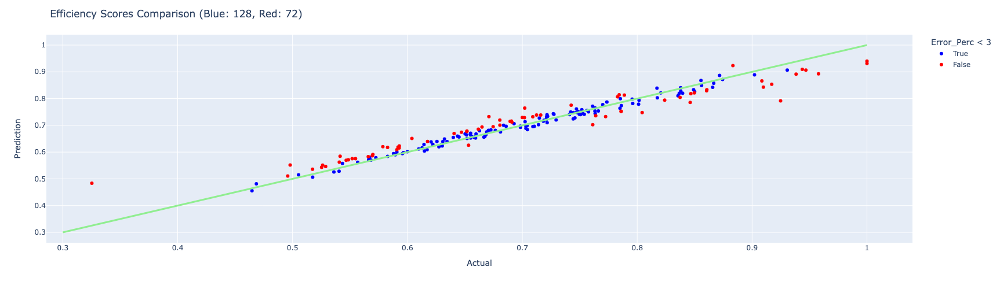

In [70]:
compareML(pipe_gb, y)

blue :  423
red :  577


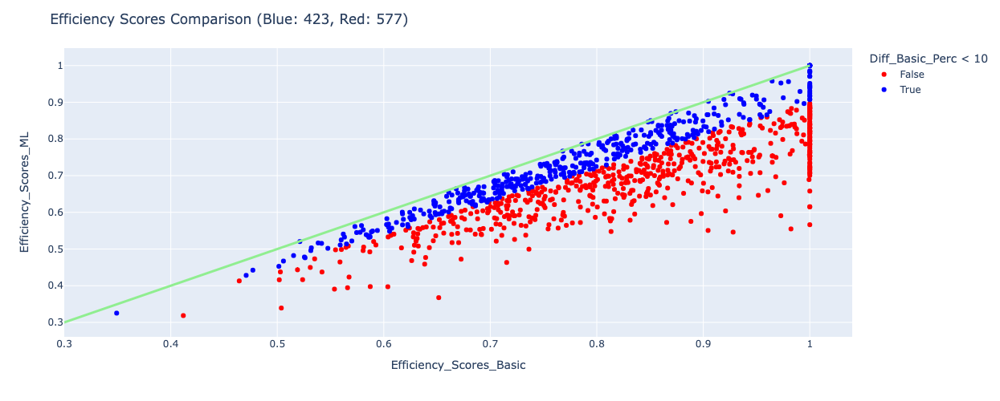

blue :  1000
red :  0


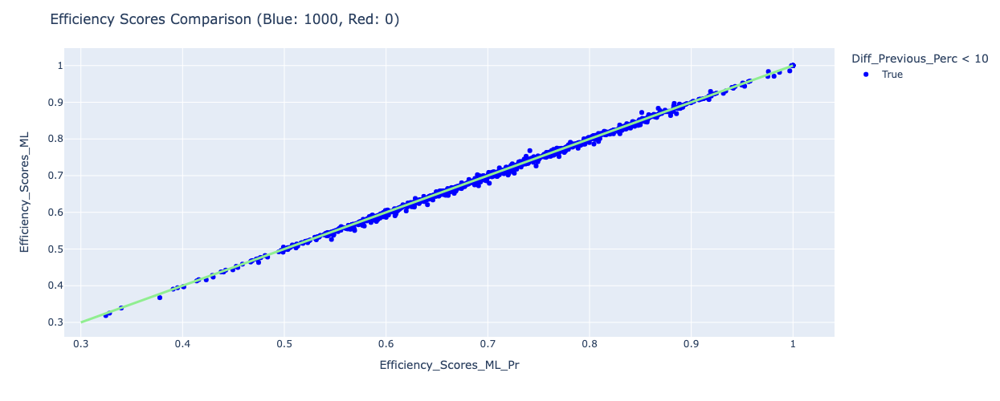

In [71]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_9.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_8.xlsx")

### i = 10

In [72]:
i +=1

In [73]:
#for r in results[-1:]:
#    deasolver(inputfile="Data/US12I1O.xlsx", folder = "Data/Data12/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

df_zero: 
 Weight_Input 01       0
Weight_Input 02     813
Weight_Input 03     278
Weight_Input 04      89
Weight_Input 05     156
Weight_Input 06       1
Weight_Input 07     175
Weight_Input 08     196
Weight_Input 09     148
Weight_Input 10     166
Weight_Input 11     175
Weight_Input 12     139
Weight_Output 01      0
dtype: int64
Total Zeros:  2336
neg_mean_squared_error: -0.0005990536527974071
neg_root_mean_squared_error: -0.024326542591529887
r2: 0.9555882929446986
grid.best_score:  -0.019442266585563358
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_rate': 0.1}
grid.best_estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingregressor',
                 GradientBoostingRegressor(max_depth=5,

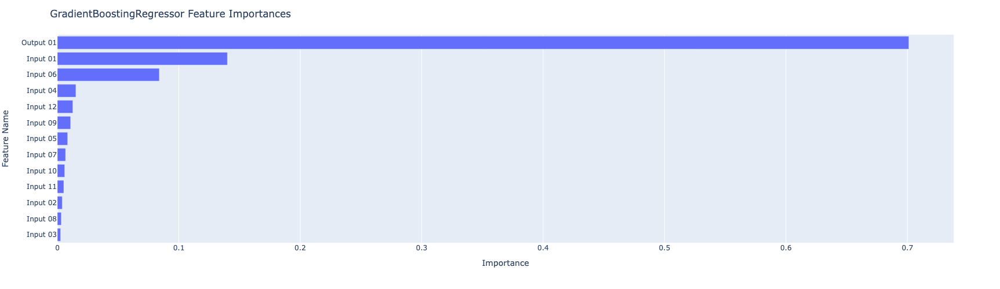

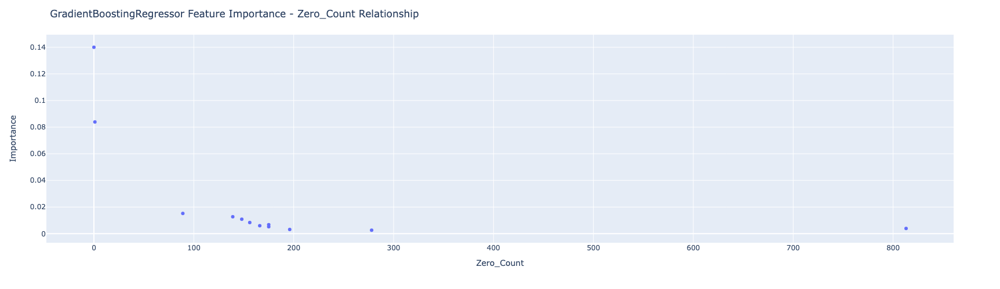

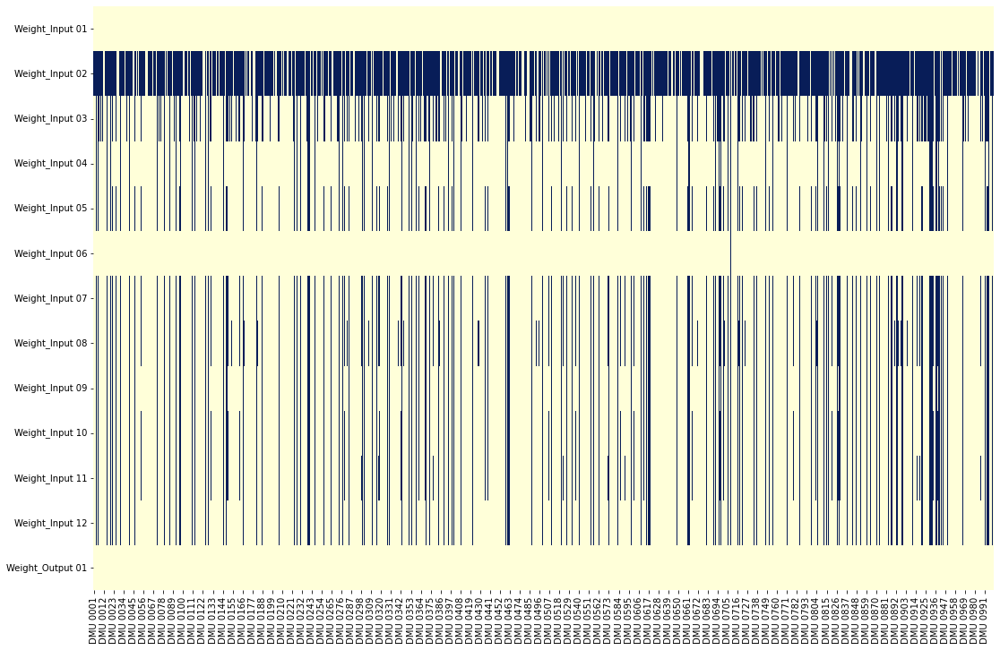

In [74]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/Data12/US12I1O_gradientboostingregressor_Sol_10.xlsx", i=i)
results.append(r)

In [75]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.6146  0.6128  0.0017      0.2849            True
1        0.5970  0.5852  0.0119      2.0316            True
2        0.8202  0.8223 -0.0022     -0.2645            True
3        0.7968  0.7888  0.0080      1.0097            True
4        0.6889  0.7092 -0.0203     -2.8563            True
..          ...     ...     ...         ...             ...
195      0.7085  0.7613 -0.0529     -6.9433           False
196      0.8018  0.7901  0.0117      1.4862            True
197      0.7638  0.7877 -0.0238     -3.0261           False
198      0.7655  0.7908 -0.0253     -3.1991           False
199      0.7337  0.7725 -0.0389     -5.0306           False

[200 rows x 5 columns]
blue:  137
red:  63
rho: 0.9825
p-Value 0.0


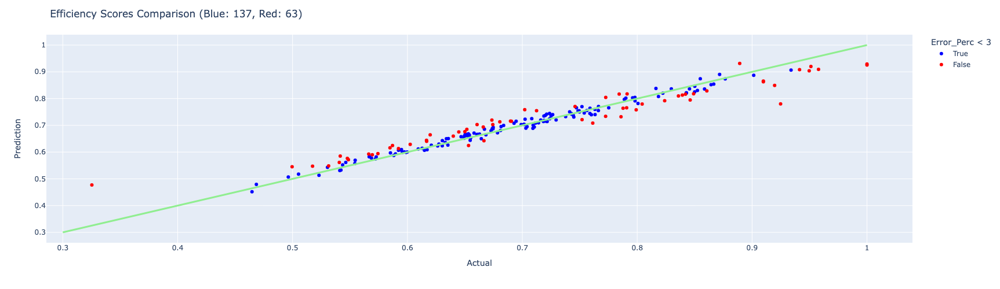

In [76]:
compareML(pipe_gb, y)

blue :  425
red :  575


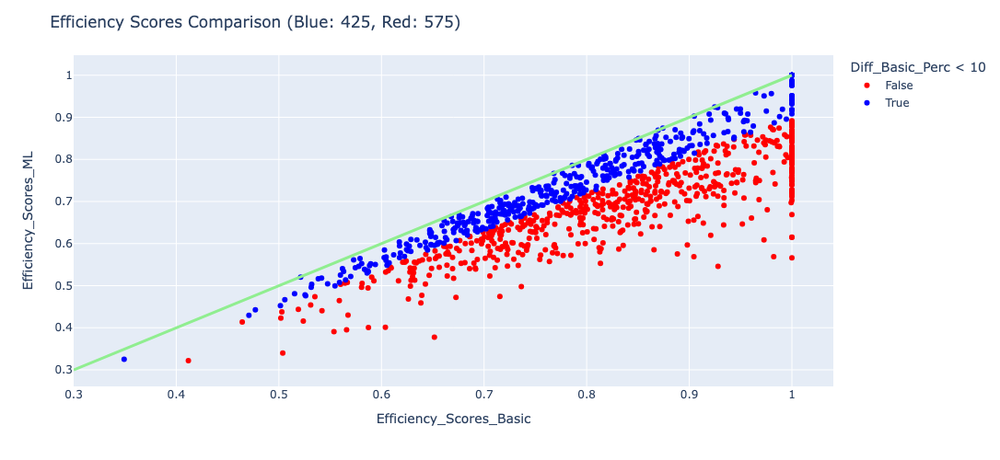

blue :  1000
red :  0


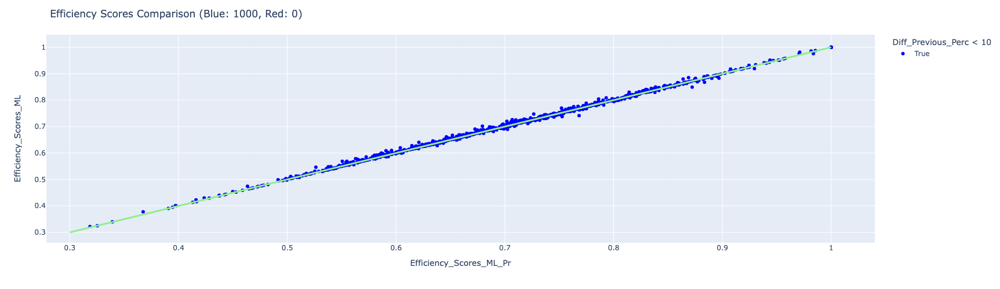

In [79]:
compareES(df_1_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_10.xlsx", df_0_path="Data/Data12/US12I1O_gradientboostingregressor_Sol_9.xlsx")

In [78]:
#with open('Data/Data12/GB_result_12I1O.pkl', 'wb') as f:
#    pickle.dump(results, f)

In [80]:
with open('Data/Data12/GB_result_12I1O.pkl', 'rb') as f:
    r = pickle.load(f)

In [84]:
#df_imp.to_pickle('Data/Data12/GB_12I1O_df_imp.pkl')

In [16]:
!jupyter nbconvert DEA_ML_12I_1O_GB_Recurcive.ipynb --to html --no-input --no-prompt

[NbConvertApp] Converting notebook DEA_ML_12I_1O_GB_Recurcive.ipynb to html
[NbConvertApp] Writing 2286307 bytes to DEA_ML_12I_1O_GB_Recurcive.html
